In [1]:
import os
import pandas as pd
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
sns.set(style='whitegrid')

#from wordcloud import WordCloud
import tensorflow as tf
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer
from sklearn.model_selection import train_test_split
from sklearn.decomposition import PCA, TruncatedSVD
from sklearn.metrics import classification_report,confusion_matrix
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences
from keras.models import Sequential
from keras.layers import Embedding, LSTM,Dense, SpatialDropout1D, Dropout
from keras.initializers import Constant

# Reset individual options to default
pd.reset_option('display.max_columns')
pd.reset_option('display.max_rows')
pd.reset_option('display.max_colwidth')

# Set desired options
pd.set_option('display.max_columns', 100)
pd.set_option('display.max_rows', 900)
pd.set_option('display.max_colwidth', 200)

import warnings
warnings.filterwarnings("ignore")

In [3]:
train = pd.read_csv('data/training.csv',header=None)
validation = pd.read_csv('data/validation.csv',header=None)

train.columns=['Tweet ID','Entity','Sentiment','Tweet Content']
validation.columns=['Tweet ID','Entity','Sentiment','Tweet Content']

print("Training DataSet: \n")
train = train.sample(5000)
display(train.head())

Training DataSet: 



,Tweet ID,Entity,Sentiment,Tweet Content
52874,10684,RedDeadRedemption(RDR),Positive,Red Dead Redemption 2 - the best game of all time so far
43612,10286,PlayerUnknownsBattlegrounds(PUBG),Negative,Dear General @PUBG_Support and many time we got all killed just days after u landiAnd my military rank is just crown v. How can we i used hacker ID to boost my rank rank. please unblock my account...
59820,3453,Facebook,Irrelevant,I truly love to spend time with boys friends because they are doing some crazy stuff and their memories are unforgettable
59546,3407,Facebook,Negative,"Comment from one group I know, re @ Facebook and its ""promotion platform"""
23002,4341,CS-GO,Negative,csgo f pls stop you ranking me up games that are getting harder huhu


In [5]:
print("Validation DataSet: \n")
display(validation.head())

Validation DataSet: 



,Tweet ID,Entity,Sentiment,Tweet Content
0,3364,Facebook,Irrelevant,"I mentioned on Facebook that I was struggling for motivation to go for a run the other day, which has been translated by Tom’s great auntie as ‘Hayley can’t get out of bed’ and told to his grandma..."
1,352,Amazon,Neutral,BBC News - Amazon boss Jeff Bezos rejects claims company acted like a 'drug dealer' bbc.co.uk/news/av/busine…
2,8312,Microsoft,Negative,@Microsoft Why do I pay for WORD when it functions so poorly on my @SamsungUS Chromebook? 🙄
3,4371,CS-GO,Negative,"CSGO matchmaking is so full of closet hacking, it's a truly awful game."
4,4433,Google,Neutral,Now the President is slapping Americans in the face that he really did commit an unlawful act after his acquittal! From Discover on Google vanityfair.com/news/2020/02/t…


In [7]:
train = train.dropna(subset=['Tweet Content'])

display(train.isnull().sum())
print("*****"* 5)
display(validation.isnull().sum())

Tweet ID         0
Entity           0
Sentiment        0
Tweet Content    0
dtype: int64

*************************


Tweet ID         0
Entity           0
Sentiment        0
Tweet Content    0
dtype: int64

In [9]:
duplicates = train[train.duplicated(subset=['Entity', 'Sentiment', 'Tweet Content'], keep=False)]
train = train.drop_duplicates(subset=['Entity', 'Sentiment', 'Tweet Content'], keep='first')

duplicates = validation[validation.duplicated(subset=['Entity', 'Sentiment', 'Tweet Content'], keep=False)]
validation = validation.drop_duplicates(subset=['Entity', 'Sentiment', 'Tweet Content'], keep='first')

In [11]:
import pandas as pd

# Assuming 'train' and 'validation' are your DataFrames

# Calculate sentiment counts for train and validation data
sentiment_counts_train = train['Sentiment'].value_counts()
sentiment_counts_validation = validation['Sentiment'].value_counts()

# Combine counts into a single DataFrame
combined_counts = pd.concat([sentiment_counts_train, sentiment_counts_validation], axis=1)

# Fill missing values (if any) with 0
combined_counts.fillna(0, inplace=True)

# Rename columns
combined_counts.columns = ['Test Data', 'Validation Data']  # Set desired column names

combined_counts

,Test Data,Validation Data
Sentiment,,
Negative,1505,266
Positive,1387,277
Neutral,1219,285
Irrelevant,829,172


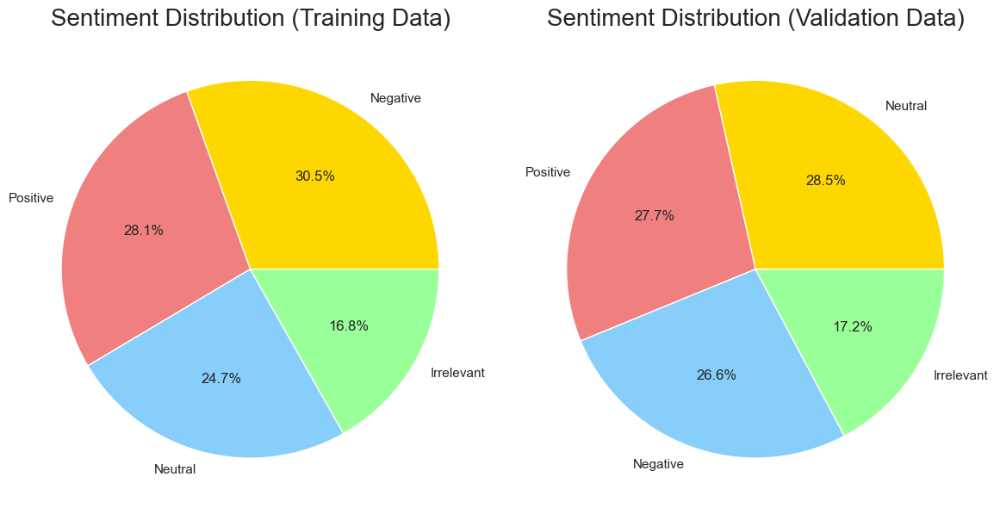

In [13]:
import pandas as pd
import matplotlib.pyplot as plt

# Assuming 'train' and 'validation' are your DataFrames

# Calculate sentiment counts
sentiment_counts_train = train['Sentiment'].value_counts()
sentiment_counts_validation = validation['Sentiment'].value_counts()

# Create subplots for side-by-side comparison
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 6))  # Adjust figsize for better view

# Create pie chart for training data
ax1.pie(sentiment_counts_train, labels=sentiment_counts_train.index, autopct='%1.1f%%', colors=['gold', 'lightcoral', 'lightskyblue','#99FF99'])
ax1.set_title('Sentiment Distribution (Training Data)', fontsize=20)

# Create pie chart for validation data
ax2.pie(sentiment_counts_validation, labels=sentiment_counts_validation.index, autopct='%1.1f%%', colors=['gold', 'lightcoral', 'lightskyblue','#99FF99'])
ax2.set_title('Sentiment Distribution (Validation Data)', fontsize=20)

# Adjust layout for better visualization
plt.tight_layout()
plt.show()

In [15]:
# Calculate the value counts of 'Entity'
entity_counts = train['Entity'].value_counts()

# Get the top 9 names
top_names = entity_counts.head(19)

# Aggregate the tenth name as 'Other'
other_count = entity_counts[19:].sum()
top_names['Other'] = other_count

# Display the top 19 names and 'Other'
top_names.to_frame()

,count
Entity,
PlayStation5(PS5),178
FIFA,173
MaddenNFL,172
TomClancysGhostRecon,171
Dota2,170
Facebook,169
johnson&johnson,168
CallOfDuty,166
WorldOfCraft,166


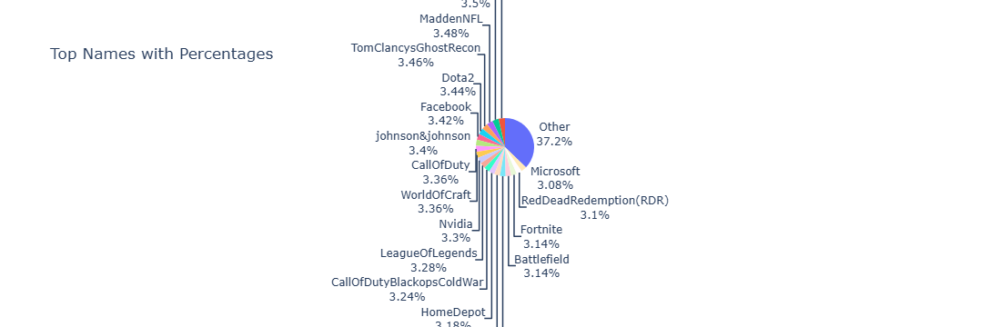

In [17]:
import plotly.express as px
import plotly.graph_objects as go
import plotly.io as pio

# Calculate the percentages
percentages = (top_names / top_names.sum()) * 100

# Create the pie chart
fig = go.Figure(data=[go.Pie(
    labels=percentages.index,
    values=percentages,
    textinfo='label+percent',
    insidetextorientation='radial'
)])

# Update layout
fig.update_layout(
    title_text='Top Names with Percentages',
    showlegend=False
)

# Show the plot
fig.show()

In [10]:
from tensorflow.keras.layers import Input, Dropout, Dense
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.initializers import TruncatedNormal
from tensorflow.keras.losses import CategoricalCrossentropy
from tensorflow.keras.metrics import CategoricalAccuracy
from tensorflow.keras.utils import to_categorical

import pandas as pd
from sklearn.model_selection import train_test_split

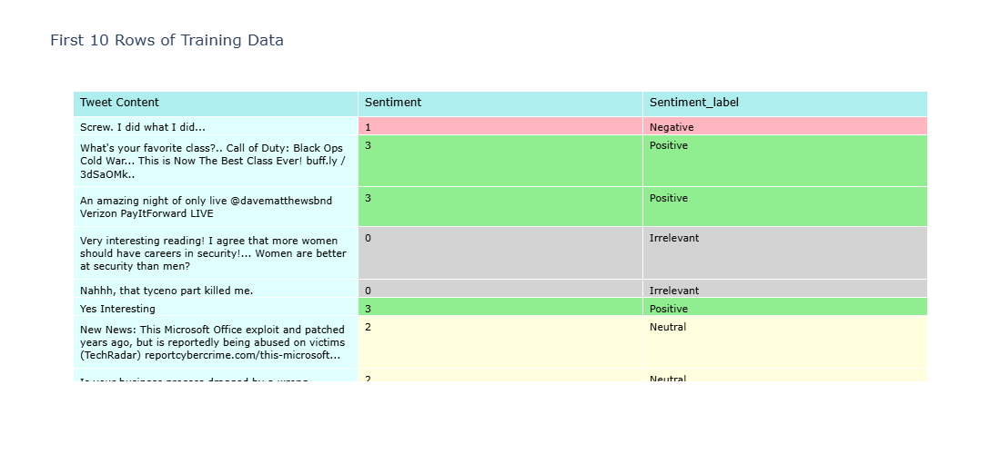

In [11]:
import pandas as pd
import plotly.graph_objects as go

# Assuming you've already run the data preprocessing steps
data = train[['Tweet Content', 'Sentiment']]

# Set your model output as categorical and save in new label col
data['Sentiment_label'] = pd.Categorical(data['Sentiment'])

# Transform your output to numeric
data['Sentiment'] = data['Sentiment_label'].cat.codes

# Use the entire training data as data_train
data_train = data

# Use validation data as data_test
data_test = validation[['Tweet Content', 'Sentiment']]
data_test['Sentiment_label'] = pd.Categorical(data_test['Sentiment'])
data_test['Sentiment'] = data_test['Sentiment_label'].cat.codes

# Create a colorful table using Plotly
fig = go.Figure(data=[go.Table(
    header=dict(
        values=list(data_train.columns),
        fill_color='paleturquoise',
        align='left',
        font=dict(color='black', size=12)
    ),
    cells=dict(
        values=[data_train[k].tolist()[:10] for k in data_train.columns],
        fill_color=[
            'lightcyan',  # Tweet Content
            ['lightgreen' if s == 'Positive' else 'lightpink' if s == 'Negative'
              else 'lightyellow' if s == 'Neutral' else 'lightgray' for s in data_train['Sentiment_label'][:10]],  # Sentiment
            ['lightgreen' if s == 'Positive' else 'lightpink' if s == 'Negative'
              else 'lightyellow' if s == 'Neutral' else 'lightgray' for s in data_train['Sentiment_label'][:10]],  # Sentiment_label
            'lavender'  # Sentiment (numeric)
        ],
        align='left',
        font=dict(color='black', size=11)
    ))
])

# Update the layout
fig.update_layout(
    title='First 10 Rows of Training Data',
    width=1000,
    height=500,
)

fig.show()


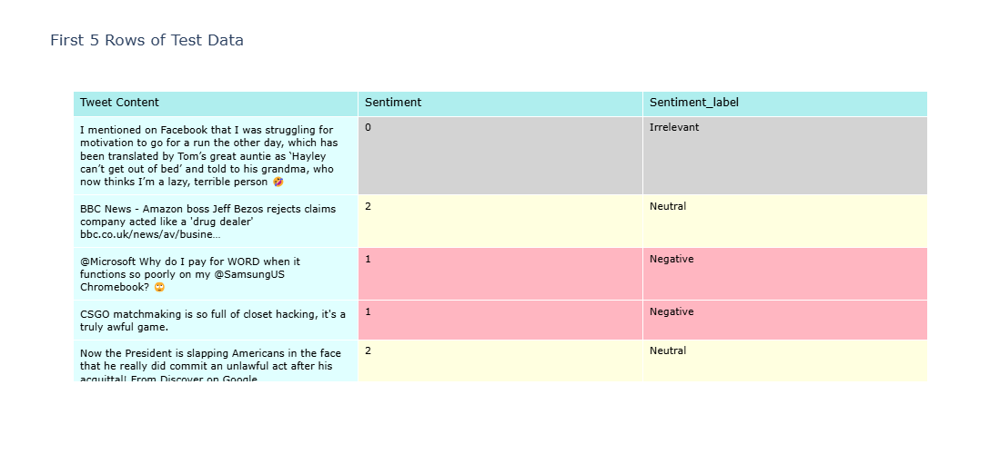

In [12]:
import plotly.graph_objects as go

# Create a colorful table using Plotly for the test data
fig = go.Figure(data=[go.Table(
    header=dict(
        values=list(data_test.columns),
        fill_color='paleturquoise',
        align='left',
        font=dict(color='black', size=12)
    ),
    cells=dict(
        values=[data_test[k].tolist()[:5] for k in data_test.columns],  # Show first 5 rows
        fill_color=[
            'lightcyan',  # Tweet Content
            ['lightgreen' if s == 'Positive' else 'lightpink' if s == 'Negative'
             else 'lightyellow' if s == 'Neutral' else 'lightgray' for s in data_test['Sentiment_label'][:5]],  # Sentiment
            ['lightgreen' if s == 'Positive' else 'lightpink' if s == 'Negative'
             else 'lightyellow' if s == 'Neutral' else 'lightgray' for s in data_test['Sentiment_label'][:5]],  # Sentiment_label
            'lavender'  # Sentiment (numeric)
        ],
        align='left',
        font=dict(color='black', size=11)
    ))
])

# Update the layout
fig.update_layout(
    title='First 5 Rows of Test Data',
    width=1000,
    height=500,
)

# Show the figure
fig.show()

# If you want to save the figure as an HTML file, uncomment the following line:
# fig.write_html("test_data_sample.html")

In [13]:
#BERT (Bidirectional Encoder Representations from Transformers)

In [14]:
%%time

import pandas as pd
import torch
from torch.utils.data import Dataset, DataLoader
from transformers import BertTokenizer, BertForSequenceClassification, AdamW
from sklearn.metrics import accuracy_score, classification_report

# Preprocess the dataF
def preprocess_data(df):
    df['label'] = df['Sentiment_label'].map({'Positive': 2, 'Negative': 0, 'Neutral': 1, 'Irrelevant': 3})
    return df['Tweet Content'].tolist(), df['label'].tolist()

train_texts, train_labels = preprocess_data(data_train)
test_texts, test_labels = preprocess_data(data_test)

# Create a custom dataset
class SentimentDataset(Dataset):
    def __init__(self, texts, labels, tokenizer, max_len=128):
        self.texts = texts
        self.labels = labels
        self.tokenizer = tokenizer
        self.max_len = max_len

    def __len__(self):
        return len(self.texts)

    def __getitem__(self, idx):
        text = str(self.texts[idx])
        label = self.labels[idx]

        encoding = self.tokenizer.encode_plus(
            text,
            add_special_tokens=True,
            max_length=self.max_len,
            return_token_type_ids=False,
            padding='max_length',
            truncation=True,
            return_attention_mask=True,
            return_tensors='pt',
        )

        return {
            'input_ids': encoding['input_ids'].flatten(),
            'attention_mask': encoding['attention_mask'].flatten(),
            'labels': torch.tensor(label, dtype=torch.long)
        }

# Initialize tokenizer and create datasets
tokenizer = BertTokenizer.from_pretrained('bert-base-uncased')
train_dataset = SentimentDataset(train_texts, train_labels, tokenizer)
test_dataset = SentimentDataset(test_texts, test_labels, tokenizer)

# Create data loaders
train_loader = DataLoader(train_dataset, batch_size=16, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=16, shuffle=False)

# Initialize the model_BERT
model_BERT = BertForSequenceClassification.from_pretrained('bert-base-uncased', num_labels=4)
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model_BERT.to(device)

# Set up optimizer
optimizer = AdamW(model_BERT.parameters(), lr=2e-5)

# Training loop
num_epochs = 3

for epoch in range(num_epochs):
    model_BERT.train()
    for batch in train_loader:
        optimizer.zero_grad()
        input_ids = batch['input_ids'].to(device)
        attention_mask = batch['attention_mask'].to(device)
        labels = batch['labels'].to(device)
        outputs = model_BERT(input_ids, attention_mask=attention_mask, labels=labels)
        loss = outputs.loss
        loss.backward()
        optimizer.step()

    # Evaluation on test set
    model_BERT.eval()
    test_preds = []
    test_true = []
    with torch.no_grad():
        for batch in test_loader:
            input_ids = batch['input_ids'].to(device)
            attention_mask = batch['attention_mask'].to(device)
            labels = batch['labels']
            outputs = model_BERT(input_ids, attention_mask=attention_mask)
            preds = torch.argmax(outputs.logits, dim=1).cpu().numpy()
            test_preds.extend(preds)
            test_true.extend(labels.numpy())

    accuracy = accuracy_score(test_true, test_preds)
    print(f'Epoch {epoch + 1}/{num_epochs}, Test Accuracy: {accuracy:.4f}')


# Save the model_BERT
torch.save(model_BERT.state_dict(), 'sentiment_model_BERT.pth')

Some weights of BertForSequenceClassification were not initialized from the model checkpoint at bert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Epoch 1/3, Test Accuracy: 0.5930
Epoch 2/3, Test Accuracy: 0.6600
Epoch 3/3, Test Accuracy: 0.6690
CPU times: total: 25min 24s
Wall time: 54min 47s


In [15]:
# Final evaluation
print(classification_report(test_true, test_preds, target_names=['Negative', 'Neutral', 'Positive', 'Irrelevant']))

              precision    recall  f1-score   support

    Negative       0.66      0.82      0.73       266
     Neutral       0.74      0.53      0.62       285
    Positive       0.74      0.73      0.73       277
  Irrelevant       0.51      0.56      0.53       172

    accuracy                           0.67      1000
   macro avg       0.66      0.66      0.65      1000
weighted avg       0.68      0.67      0.67      1000



In [16]:
# Assuming test_true and test_preds are defined
from sklearn.metrics import confusion_matrix

# Check if test_true labels need conversion (optional)
if not isinstance(test_true[0], str):  # If labels are not strings
    from sklearn.preprocessing import LabelEncoder
    encoder = LabelEncoder()
    test_true_encoded = encoder.fit_transform(test_true)  # Encode labels
    labels = [0, 1, 2, 3]  # Numerical labels
else:
    test_true_encoded = test_true
    labels = ['Negative', 'Neutral', 'Positive', 'Irrelevant']  # String labels

# Calculate confusion matrix with consistent labels
confusion_matrix_BERT = confusion_matrix(test_true_encoded, test_preds, labels=labels)

print("Confusion matrix BERT \n")
confusion_matrix_BERT

Confusion matrix BERT 



array([[218,  20,  13,  15],
       [ 55, 152,  32,  46],
       [ 23,  19, 202,  33],
       [ 35,  14,  26,  97]], dtype=int64)

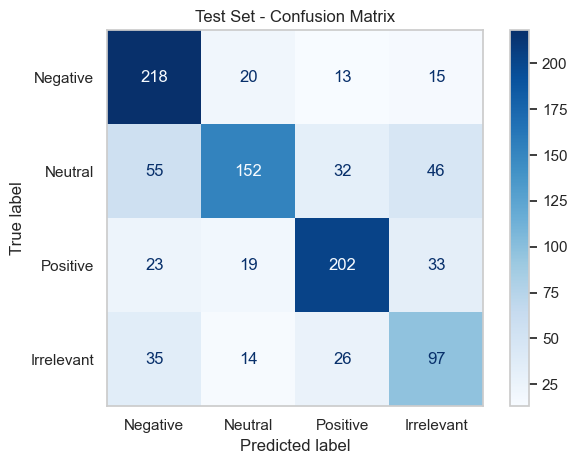

In [17]:
from sklearn.metrics import classification_report, confusion_matrix, ConfusionMatrixDisplay
labels = ['Negative', 'Neutral', 'Positive', 'Irrelevant']  # String labels
test_display = ConfusionMatrixDisplay(confusion_matrix=confusion_matrix_BERT, display_labels=labels)
test_display.plot(cmap='Blues')
plt.title("Test Set - Confusion Matrix")
plt.grid(False)
plt.tight_layout()
plt.show()

In [18]:
#RoBERTa (Robustly Optimized BERT Pretraining Approach)

In [19]:
%%time

import pandas as pd
import torch
from torch.utils.data import Dataset, DataLoader
from transformers import BertTokenizer, BertForSequenceClassification, AdamW
from transformers import RobertaTokenizer, RobertaForSequenceClassification, AdamW
from sklearn.metrics import accuracy_score, classification_report

# Preprocess the data
def preprocess_data(df):
    df['label'] = df['Sentiment_label'].map({'Positive': 2, 'Negative': 0, 'Neutral': 1, 'Irrelevant': 3})
    return df['Tweet Content'].tolist(), df['label'].tolist()

train_texts, train_labels = preprocess_data(data_train)
test_texts, test_labels = preprocess_data(data_test)

# Create a custom dataset
class SentimentDataset(Dataset):
    def __init__(self, texts, labels, tokenizer, max_len=128):
        self.texts = texts
        self.labels = labels
        self.tokenizer = tokenizer
        self.max_len = max_len

    def __len__(self):
        return len(self.texts)

    def __getitem__(self, idx):
        text = str(self.texts[idx])
        label = self.labels[idx]

        encoding = self.tokenizer.encode_plus(
            text,
            add_special_tokens=True,
            max_length=self.max_len,
            return_token_type_ids=False,
            padding='max_length',
            truncation=True,
            return_attention_mask=True,
            return_tensors='pt',
        )

        return {
            'input_ids': encoding['input_ids'].flatten(),
            'attention_mask': encoding['attention_mask'].flatten(),
            'labels': torch.tensor(label, dtype=torch.long)
        }

# Initialize tokenizer and create datasets
#tokenizer = BertTokenizer.from_pretrained('bert-base-uncased')
tokenizer = RobertaTokenizer.from_pretrained('roberta-base')
train_dataset = SentimentDataset(train_texts, train_labels, tokenizer)
test_dataset = SentimentDataset(test_texts, test_labels, tokenizer)

# Create data loaders
train_loader = DataLoader(train_dataset, batch_size=16, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=16, shuffle=False)

# Initialize the model
#model = BertForSequenceClassification.from_pretrained('bert-base-uncased', num_labels=4)
model_RoBERTa = RobertaForSequenceClassification.from_pretrained('roberta-base', num_labels=4)
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model_RoBERTa.to(device)

# Set up optimizer
optimizer = AdamW(model_RoBERTa.parameters(), lr=2e-5)

# Training loop
num_epochs = 3

for epoch in range(num_epochs):
    model_RoBERTa.train()
    for batch in train_loader:
        optimizer.zero_grad()
        input_ids = batch['input_ids'].to(device)
        attention_mask = batch['attention_mask'].to(device)
        labels = batch['labels'].to(device)
        outputs = model_RoBERTa(input_ids, attention_mask=attention_mask, labels=labels)
        loss = outputs.loss
        loss.backward()
        optimizer.step()

    # Evaluation on test set
    model_RoBERTa.eval()
    test_preds = []
    test_true = []
    with torch.no_grad():
        for batch in test_loader:
            input_ids = batch['input_ids'].to(device)
            attention_mask = batch['attention_mask'].to(device)
            labels = batch['labels']
            outputs = model_RoBERTa(input_ids, attention_mask=attention_mask)
            preds = torch.argmax(outputs.logits, dim=1).cpu().numpy()
            test_preds.extend(preds)
            test_true.extend(labels.numpy())

    accuracy = accuracy_score(test_true, test_preds)
    print(f'Epoch {epoch + 1}/{num_epochs}, Test Accuracy: {accuracy:.4f}')


# Save the model
torch.save(model_RoBERTa.state_dict(), 'sentiment_RoBERTa_model.pth')

Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at roberta-base and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Epoch 1/3, Test Accuracy: 0.6440
Epoch 2/3, Test Accuracy: 0.6630
Epoch 3/3, Test Accuracy: 0.6980
CPU times: total: 59min 25s
Wall time: 1h 1min 6s


In [20]:
# Final evaluation
print(classification_report(test_true, test_preds, target_names=['Negative', 'Neutral', 'Positive', 'Irrelevant']))

              precision    recall  f1-score   support

    Negative       0.70      0.86      0.77       266
     Neutral       0.70      0.62      0.66       285
    Positive       0.76      0.74      0.75       277
  Irrelevant       0.58      0.52      0.55       172

    accuracy                           0.70      1000
   macro avg       0.69      0.68      0.68      1000
weighted avg       0.70      0.70      0.69      1000



In [21]:
# Assuming test_true and test_preds are defined
from sklearn.metrics import confusion_matrix

# Check if test_true labels need conversion (optional)
if not isinstance(test_true[0], str):  # If labels are not strings
    from sklearn.preprocessing import LabelEncoder
    encoder = LabelEncoder()
    test_true_encoded = encoder.fit_transform(test_true)  # Encode labels
    labels = [0, 1, 2, 3]  # Numerical labels
else:
    test_true_encoded = test_true
    labels = ['Negative', 'Neutral', 'Positive', 'Irrelevant']  # String labels

# Calculate confusion matrix with consistent labels
confusion_matrix_RoBERTa = confusion_matrix(test_true_encoded, test_preds, labels=labels)

print("Confusion matrix RoBERTa \n")
confusion_matrix_RoBERTa

Confusion matrix RoBERTa 



array([[228,  21,  11,   6],
       [ 50, 176,  27,  32],
       [ 19,  28, 204,  26],
       [ 31,  26,  25,  90]], dtype=int64)

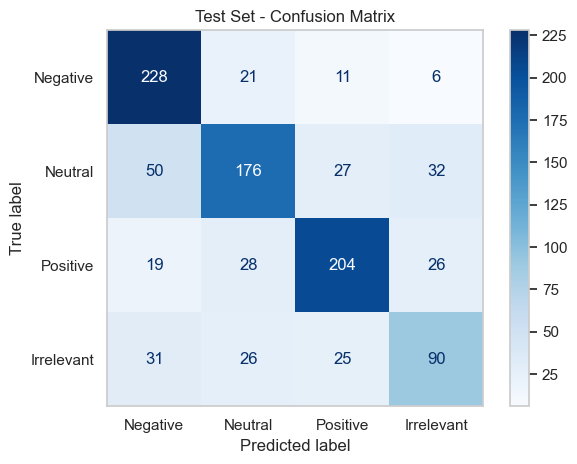

In [22]:
from sklearn.metrics import classification_report, confusion_matrix, ConfusionMatrixDisplay
labels = ['Negative', 'Neutral', 'Positive', 'Irrelevant']  # String labels
test_display = ConfusionMatrixDisplay(confusion_matrix=confusion_matrix_RoBERTa, display_labels=labels)
test_display.plot(cmap='Blues')
plt.title("Test Set - Confusion Matrix")
plt.grid(False)
plt.tight_layout()
plt.show()

In [23]:
#DistilBERT (Distilled version of BERT)

In [24]:
%%time

import pandas as pd
import torch
from torch.utils.data import Dataset, DataLoader
from transformers import DistilBertTokenizer, DistilBertForSequenceClassification, AdamW
from sklearn.metrics import accuracy_score, classification_report

# Preprocess the data
def preprocess_data(df):
    df['label'] = df['Sentiment_label'].map({'Positive': 2, 'Negative': 0, 'Neutral': 1, 'Irrelevant': 3})
    return df['Tweet Content'].tolist(), df['label'].tolist()

train_texts, train_labels = preprocess_data(data_train)
test_texts, test_labels = preprocess_data(data_test)

# Create a custom dataset
class SentimentDataset(Dataset):
    def __init__(self, texts, labels, tokenizer, max_len=128):
        self.texts = texts
        self.labels = labels
        self.tokenizer = tokenizer
        self.max_len = max_len

    def __len__(self):
        return len(self.texts)

    def __getitem__(self, idx):
        text = str(self.texts[idx])
        label = self.labels[idx]

        encoding = self.tokenizer.encode_plus(
            text,
            add_special_tokens=True,
            max_length=self.max_len,
            return_token_type_ids=False,
            padding='max_length',
            truncation=True,
            return_attention_mask=True,
            return_tensors='pt',
        )

        return {
            'input_ids': encoding['input_ids'].flatten(),
            'attention_mask': encoding['attention_mask'].flatten(),
            'labels': torch.tensor(label, dtype=torch.long)
        }

# Initialize tokenizer and create datasets
tokenizer = DistilBertTokenizer.from_pretrained('distilbert-base-uncased')
train_dataset = SentimentDataset(train_texts, train_labels, tokenizer)
test_dataset = SentimentDataset(test_texts, test_labels, tokenizer)

# Create data loaders
train_loader = DataLoader(train_dataset, batch_size=16, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=16, shuffle=False)

# Initialize the model DistilBERT
model_DistilBERT = DistilBertForSequenceClassification.from_pretrained('distilbert-base-uncased', num_labels=4)
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model_DistilBERT.to(device)

# Set up optimizer
optimizer = AdamW(model_DistilBERT.parameters(), lr=2e-5)

# Training loop
num_epochs = 3

for epoch in range(num_epochs):
    model_DistilBERT.train()
    for batch in train_loader:
        optimizer.zero_grad()
        input_ids = batch['input_ids'].to(device)
        attention_mask = batch['attention_mask'].to(device)
        labels = batch['labels'].to(device)
        outputs = model_DistilBERT(input_ids, attention_mask=attention_mask, labels=labels)
        loss = outputs.loss
        loss.backward()
        optimizer.step()

    # Evaluation on test set
    model_DistilBERT.eval()
    test_preds = []
    test_true = []
    with torch.no_grad():
        for batch in test_loader:
            input_ids = batch['input_ids'].to(device)
            attention_mask = batch['attention_mask'].to(device)
            labels = batch['labels']
            outputs = model_DistilBERT(input_ids, attention_mask=attention_mask)
            preds = torch.argmax(outputs.logits, dim=1).cpu().numpy()
            test_preds.extend(preds)
            test_true.extend(labels.numpy())

    accuracy = accuracy_score(test_true, test_preds)
    print(f'Epoch {epoch + 1}/{num_epochs}, Test Accuracy: {accuracy:.4f}')


# Save the model_DistilBERT
torch.save(model_DistilBERT.state_dict(), 'sentiment_model_distilbert.pth')

OSError: Can't load tokenizer for 'distilbert-base-uncased'. If you were trying to load it from 'https://huggingface.co/models', make sure you don't have a local directory with the same name. Otherwise, make sure 'distilbert-base-uncased' is the correct path to a directory containing all relevant files for a DistilBertTokenizer tokenizer.

In [25]:
# Final evaluation
print(classification_report(test_true, test_preds, target_names=['Negative', 'Neutral', 'Positive', 'Irrelevant']))

              precision    recall  f1-score   support

    Negative       0.70      0.86      0.77       266
     Neutral       0.70      0.62      0.66       285
    Positive       0.76      0.74      0.75       277
  Irrelevant       0.58      0.52      0.55       172

    accuracy                           0.70      1000
   macro avg       0.69      0.68      0.68      1000
weighted avg       0.70      0.70      0.69      1000



In [26]:
# Assuming test_true and test_preds are defined
from sklearn.metrics import confusion_matrix

# Check if test_true labels need conversion (optional)
if not isinstance(test_true[0], str):  # If labels are not strings
    from sklearn.preprocessing import LabelEncoder
    encoder = LabelEncoder()
    test_true_encoded = encoder.fit_transform(test_true)  # Encode labels
    labels = [0, 1, 2, 3]  # Numerical labels
else:
    test_true_encoded = test_true
    labels = ['Negative', 'Neutral', 'Positive', 'Irrelevant']  # String labels

# Calculate confusion matrix with consistent labels
confusion_matrix_DistilBERT = confusion_matrix(test_true_encoded, test_preds, labels=labels)

print("Confusion matrix DistilBERT \n")
confusion_matrix_DistilBERT

Confusion matrix DistilBERT 



array([[228,  21,  11,   6],
       [ 50, 176,  27,  32],
       [ 19,  28, 204,  26],
       [ 31,  26,  25,  90]], dtype=int64)

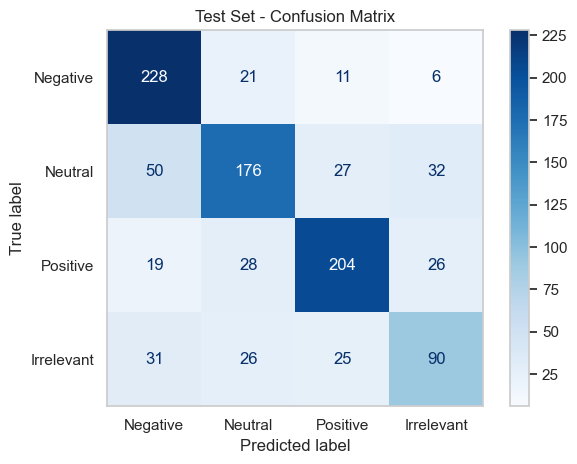

In [27]:
from sklearn.metrics import classification_report, confusion_matrix, ConfusionMatrixDisplay
labels = ['Negative', 'Neutral', 'Positive', 'Irrelevant']  # String labels
test_display = ConfusionMatrixDisplay(confusion_matrix=confusion_matrix_DistilBERT, display_labels=labels)
test_display.plot(cmap='Blues')
plt.title("Test Set - Confusion Matrix")
plt.grid(False)
plt.tight_layout()
plt.show()

In [28]:
#ALBERT (A Lite BERT)

In [29]:
%%time

import pandas as pd
import torch
from torch.utils.data import Dataset, DataLoader
from transformers import AlbertTokenizer, AlbertForSequenceClassification, AdamW
from sklearn.metrics import accuracy_score, classification_report

# Preprocess the data
def preprocess_data(df):
    df['label'] = df['Sentiment_label'].map({'Positive': 2, 'Negative': 0, 'Neutral': 1, 'Irrelevant': 3})
    return df['Tweet Content'].tolist(), df['label'].tolist()

train_texts, train_labels = preprocess_data(data_train)
test_texts, test_labels = preprocess_data(data_test)

# Create a custom dataset
class SentimentDataset(Dataset):
    def __init__(self, texts, labels, tokenizer, max_len=128):
        self.texts = texts
        self.labels = labels
        self.tokenizer = tokenizer
        self.max_len = max_len

    def __len__(self):
        return len(self.texts)

    def __getitem__(self, idx):
        text = str(self.texts[idx])
        label = self.labels[idx]

        encoding = self.tokenizer.encode_plus(
            text,
            add_special_tokens=True,
            max_length=self.max_len,
            padding='max_length',
            truncation=True,
            return_attention_mask=True,
            return_tensors='pt',
        )

        return {
            'input_ids': encoding['input_ids'].flatten(),
            'attention_mask': encoding['attention_mask'].flatten(),
            'labels': torch.tensor(label, dtype=torch.long)
        }

# Initialize tokenizer and create datasets
tokenizer = AlbertTokenizer.from_pretrained('albert-base-v2')
train_dataset = SentimentDataset(train_texts, train_labels, tokenizer)
test_dataset = SentimentDataset(test_texts, test_labels, tokenizer)

# Create data loaders
train_loader = DataLoader(train_dataset, batch_size=16, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=16, shuffle=False)

# Initialize the model
model_ALBERT = AlbertForSequenceClassification.from_pretrained('albert-base-v2', num_labels=4)
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model_ALBERT.to(device)

# Set up optimizer
optimizer = AdamW(model_ALBERT.parameters(), lr=2e-5)

# Training loop
num_epochs = 3

for epoch in range(num_epochs):
    model_ALBERT.train()
    for batch in train_loader:
        optimizer.zero_grad()
        input_ids = batch['input_ids'].to(device)
        attention_mask = batch['attention_mask'].to(device)
        labels = batch['labels'].to(device)
        outputs = model_ALBERT(input_ids, attention_mask=attention_mask, labels=labels)
        loss = outputs.loss
        loss.backward()
        optimizer.step()

    # Evaluation on test set
    model_ALBERT.eval()
    test_preds = []
    test_true = []
    with torch.no_grad():
        for batch in test_loader:
            input_ids = batch['input_ids'].to(device)
            attention_mask = batch['attention_mask'].to(device)
            labels = batch['labels']
            outputs = model_ALBERT(input_ids, attention_mask=attention_mask)
            preds = torch.argmax(outputs.logits, dim=1).cpu().numpy()
            test_preds.extend(preds)
            test_true.extend(labels.numpy())

    accuracy = accuracy_score(test_true, test_preds)
    print(f'Epoch {epoch + 1}/{num_epochs}, Test Accuracy: {accuracy:.4f}')

# Final evaluation
print(classification_report(test_true, test_preds, target_names=['Negative', 'Neutral', 'Positive', 'Irrelevant']))

# Save the model
torch.save(model_ALBERT.state_dict(), 'sentiment_model_albert.pth')

ImportError: 
AlbertTokenizer requires the SentencePiece library but it was not found in your environment. Checkout the instructions on the
installation page of its repo: https://github.com/google/sentencepiece#installation and follow the ones
that match your environment. Please note that you may need to restart your runtime after installation.


In [30]:
# Final evaluation
print(classification_report(test_true, test_preds, target_names=['Negative', 'Neutral', 'Positive', 'Irrelevant']))

              precision    recall  f1-score   support

    Negative       0.70      0.86      0.77       266
     Neutral       0.70      0.62      0.66       285
    Positive       0.76      0.74      0.75       277
  Irrelevant       0.58      0.52      0.55       172

    accuracy                           0.70      1000
   macro avg       0.69      0.68      0.68      1000
weighted avg       0.70      0.70      0.69      1000



In [31]:
# Assuming test_true and test_preds are defined
from sklearn.metrics import confusion_matrix

# Check if test_true labels need conversion (optional)
if not isinstance(test_true[0], str):  # If labels are not strings
    from sklearn.preprocessing import LabelEncoder
    encoder = LabelEncoder()
    test_true_encoded = encoder.fit_transform(test_true)  # Encode labels
    labels = [0, 1, 2, 3]  # Numerical labels
else:
    test_true_encoded = test_true
    labels = ['Negative', 'Neutral', 'Positive', 'Irrelevant']  # String labels

# Calculate confusion matrix with consistent labels
confusion_matrix_ALBERT = confusion_matrix(test_true_encoded, test_preds, labels=labels)

print("Confusion matrix ALBERT \n")
confusion_matrix_ALBERT

Confusion matrix ALBERT 



array([[228,  21,  11,   6],
       [ 50, 176,  27,  32],
       [ 19,  28, 204,  26],
       [ 31,  26,  25,  90]], dtype=int64)

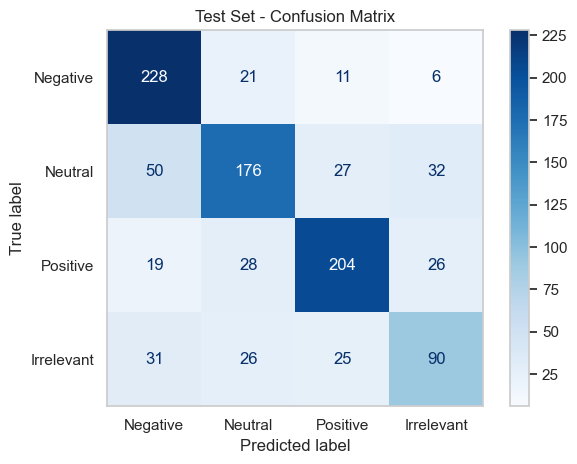

In [32]:
from sklearn.metrics import classification_report, confusion_matrix, ConfusionMatrixDisplay
labels = ['Negative', 'Neutral', 'Positive', 'Irrelevant']  # String labels
test_display = ConfusionMatrixDisplay(confusion_matrix=confusion_matrix_ALBERT, display_labels=labels)
test_display.plot(cmap='Blues')
plt.title("Test Set - Confusion Matrix")
plt.grid(False)
plt.tight_layout()
plt.show()

In [33]:
#XLNet

In [34]:
%%time
import pandas as pd
import torch
from torch.utils.data import Dataset, DataLoader
from transformers import XLNetTokenizer, XLNetForSequenceClassification, AdamW
from sklearn.metrics import accuracy_score, classification_report

# Preprocess the data
def preprocess_data(df):
    df['label'] = df['Sentiment_label'].map({'Positive': 2, 'Negative': 0, 'Neutral': 1, 'Irrelevant': 3})
    return df['Tweet Content'].tolist(), df['label'].tolist()

train_texts, train_labels = preprocess_data(data_train)
test_texts, test_labels = preprocess_data(data_test)

# Create a custom dataset
class SentimentDataset(Dataset):
    def __init__(self, texts, labels, tokenizer, max_len=128):
        self.texts = texts
        self.labels = labels
        self.tokenizer = tokenizer
        self.max_len = max_len

    def __len__(self):
        return len(self.texts)

    def __getitem__(self, idx):
        text = str(self.texts[idx])
        label = self.labels[idx]

        encoding = self.tokenizer.encode_plus(
            text,
            add_special_tokens=True,
            max_length=self.max_len,
            padding='max_length',
            truncation=True,
            return_attention_mask=True,
            return_token_type_ids=True,
            return_tensors='pt',
        )

        return {
            'input_ids': encoding['input_ids'].flatten(),
            'attention_mask': encoding['attention_mask'].flatten(),
            'token_type_ids': encoding['token_type_ids'].flatten(),
            'labels': torch.tensor(label, dtype=torch.long)
        }

# Initialize tokenizer and create datasets
tokenizer = XLNetTokenizer.from_pretrained('xlnet-base-cased')
train_dataset = SentimentDataset(train_texts, train_labels, tokenizer)
test_dataset = SentimentDataset(test_texts, test_labels, tokenizer)

# Create data loaders
train_loader = DataLoader(train_dataset, batch_size=16, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=16, shuffle=False)

# Initialize the model XLNet
model_XLNet = XLNetForSequenceClassification.from_pretrained('xlnet-base-cased', num_labels=4)
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model_XLNet.to(device)

# Set up optimizer
optimizer = AdamW(model_XLNet.parameters(), lr=2e-5)

# Training loop
num_epochs = 3

for epoch in range(num_epochs):
    model_XLNet.train()
    for batch in train_loader:
        optimizer.zero_grad()
        input_ids = batch['input_ids'].to(device)
        attention_mask = batch['attention_mask'].to(device)
        token_type_ids = batch['token_type_ids'].to(device)
        labels = batch['labels'].to(device)
        outputs = model_XLNet(input_ids, attention_mask=attention_mask, token_type_ids=token_type_ids, labels=labels)
        loss = outputs.loss
        loss.backward()
        optimizer.step()

    # Evaluation on test set
    model_XLNet.eval()
    test_preds = []
    test_true = []
    with torch.no_grad():
        for batch in test_loader:
            input_ids = batch['input_ids'].to(device)
            attention_mask = batch['attention_mask'].to(device)
            token_type_ids = batch['token_type_ids'].to(device)
            labels = batch['labels']
            outputs = model_XLNet(input_ids, attention_mask=attention_mask, token_type_ids=token_type_ids)
            preds = torch.argmax(outputs.logits, dim=1).cpu().numpy()
            test_preds.extend(preds)
            test_true.extend(labels.numpy())

    accuracy = accuracy_score(test_true, test_preds)
    print(f'Epoch {epoch + 1}/{num_epochs}, Test Accuracy: {accuracy:.4f}')

# Save the model_XLNet
torch.save(model_XLNet.state_dict(), 'sentiment_model_xlnet.pth')

ImportError: 
XLNetTokenizer requires the SentencePiece library but it was not found in your environment. Checkout the instructions on the
installation page of its repo: https://github.com/google/sentencepiece#installation and follow the ones
that match your environment. Please note that you may need to restart your runtime after installation.


In [35]:
# Final evaluation
print(classification_report(test_true, test_preds, target_names=['Negative', 'Neutral', 'Positive', 'Irrelevant']))

              precision    recall  f1-score   support

    Negative       0.70      0.86      0.77       266
     Neutral       0.70      0.62      0.66       285
    Positive       0.76      0.74      0.75       277
  Irrelevant       0.58      0.52      0.55       172

    accuracy                           0.70      1000
   macro avg       0.69      0.68      0.68      1000
weighted avg       0.70      0.70      0.69      1000



In [36]:
# Assuming test_true and test_preds are defined
from sklearn.metrics import confusion_matrix

# Check if test_true labels need conversion (optional)
if not isinstance(test_true[0], str):  # If labels are not strings
    from sklearn.preprocessing import LabelEncoder
    encoder = LabelEncoder()
    test_true_encoded = encoder.fit_transform(test_true)  # Encode labels
    labels = [0, 1, 2, 3]  # Numerical labels
else:
    test_true_encoded = test_true
    labels = ['Negative', 'Neutral', 'Positive', 'Irrelevant']  # String labels

# Calculate confusion matrix with consistent labels
confusion_matrix_XLNet = confusion_matrix(test_true_encoded, test_preds, labels=labels)

print("Confusion matrix XLNet \n")
confusion_matrix_XLNet

Confusion matrix XLNet 



array([[228,  21,  11,   6],
       [ 50, 176,  27,  32],
       [ 19,  28, 204,  26],
       [ 31,  26,  25,  90]], dtype=int64)

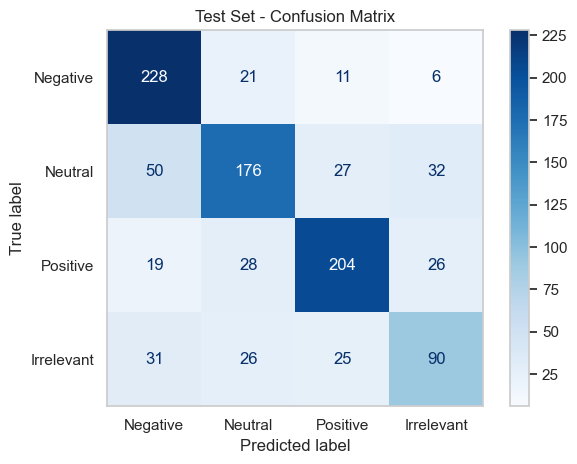

In [37]:
from sklearn.metrics import classification_report, confusion_matrix, ConfusionMatrixDisplay
labels = ['Negative', 'Neutral', 'Positive', 'Irrelevant']  # String labels
test_display = ConfusionMatrixDisplay(confusion_matrix=confusion_matrix_XLNet, display_labels=labels)
test_display.plot(cmap='Blues')
plt.title("Test Set - Confusion Matrix")
plt.grid(False)
plt.tight_layout()
plt.show()

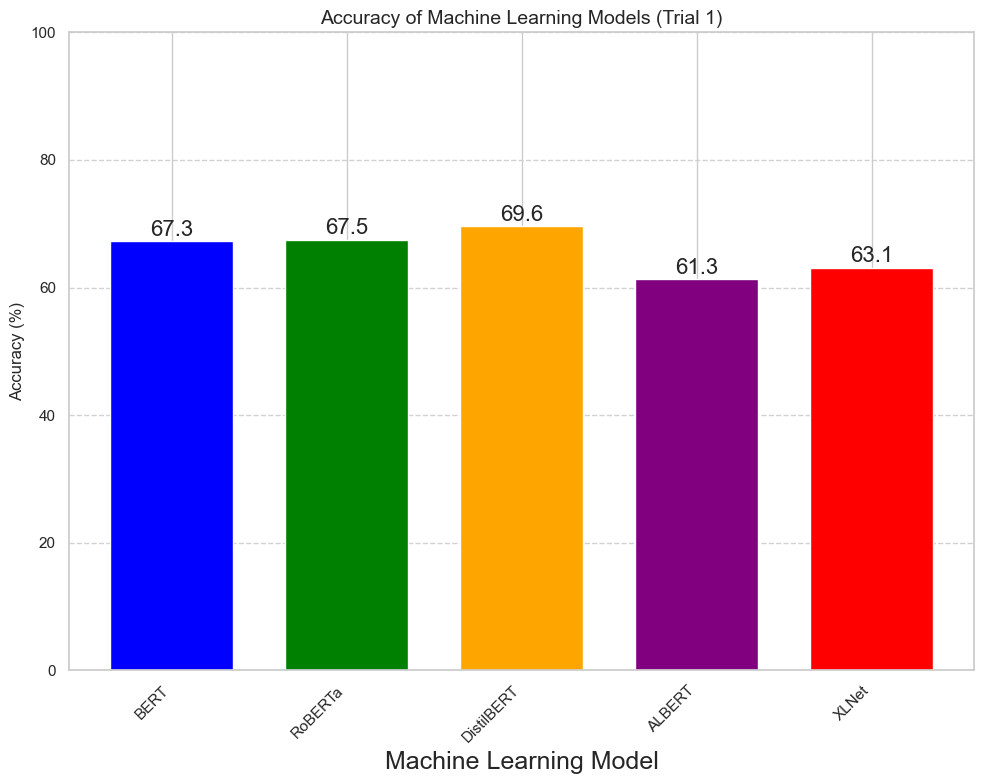

In [38]:
import matplotlib.pyplot as plt
import numpy as np

# Data for the bar graph (only Trial 1)
models = ["BERT", "RoBERTa", "DistilBERT", "ALBERT", "XLNet"]

accuracy_trial_1 = [67.3, 67.50, 69.60, 61.3, 63.1]

# Set up the plot
fig, ax = plt.subplots(figsize=(10, 8))

# Set the width of each bar and the positions of the bars
width = 0.7

# Create bars with different colors
colors = ['blue', 'green', 'orange', 'purple', 'red', 'magenta']
ax.bar(models, accuracy_trial_1, width, color=colors)

# Customize the plot
ax.set_ylabel('Accuracy (%)', fontsize=12)  # Increase font size for y-axis label
ax.set_xlabel('Machine Learning Model', fontsize=18)  # Increase font size for x-axis label
ax.set_title('Accuracy of Machine Learning Models (Trial 1)', fontsize=14)  # Increase font size for title

# Setxticks and rotate x-axis labels for better readability
ax.set_xticks(models)
ax.set_xticklabels(models, rotation=45, ha='right', fontsize=11)  # Increase font size for x-axis tick labels

# Add value labels on top of each bar with increased font size
for i, v in enumerate(accuracy_trial_1):
    ax.text(i, v + 0.2, f'{v:.1f}', ha='center', va='bottom', fontsize=16)  # Adjust vertical offset and format to one decimal place

# Set y-axis to start at 0
ax.set_ylim(0, 100)

# Add gridlines
ax.grid(axis='y', linestyle='--', alpha=0.9)

plt.tight_layout()
plt.show()

In [39]:
#T5 (Text-to-Text Transfer Transformer)

In [40]:
%%time
import pandas as pd
import torch
from torch.utils.data import Dataset, DataLoader
from transformers import T5Tokenizer, T5ForConditionalGeneration, AdamW
from sklearn.metrics import accuracy_score, classification_report

# Preprocess the data
def preprocess_data(df):
    df['label'] = df['Sentiment_label'].map({'Positive': 'positive', 'Negative': 'negative', 'Neutral': 'neutral', 'Irrelevant': 'irrelevant'})
    return df['Tweet Content'].tolist(), df['label'].tolist()

train_texts, train_labels = preprocess_data(data_train)
test_texts, test_labels = preprocess_data(data_test)

# Create a custom dataset
class SentimentDataset(Dataset):
    def __init__(self, texts, labels, tokenizer, max_len=128):
        self.texts = texts
        self.labels = labels
        self.tokenizer = tokenizer
        self.max_len = max_len

    def __len__(self):
        return len(self.texts)

    def __getitem__(self, idx):
        text = str(self.texts[idx])
        label = self.labels[idx]

        # Prepare input
        input_text = f"sentiment classification: {text}"
        input_encoding = self.tokenizer.encode_plus(
            input_text,
            add_special_tokens=True,
            max_length=self.max_len,
            padding='max_length',
            truncation=True,
            return_attention_mask=True,
            return_tensors='pt',
        )

        # Prepare target
        target_encoding = self.tokenizer.encode_plus(
            label,
            add_special_tokens=True,
            max_length=10,  # Assuming labels are short
            padding='max_length',
            truncation=True,
            return_tensors='pt',
        )

        return {
            'input_ids': input_encoding['input_ids'].flatten(),
            'attention_mask': input_encoding['attention_mask'].flatten(),
            'labels': target_encoding['input_ids'].flatten()
        }

# Initialize tokenizer and create datasets
tokenizer = T5Tokenizer.from_pretrained('t5-small')
train_dataset = SentimentDataset(train_texts, train_labels, tokenizer)
test_dataset = SentimentDataset(test_texts, test_labels, tokenizer)

# Create data loaders
train_loader = DataLoader(train_dataset, batch_size=16, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=16, shuffle=False)

# Initialize the model T5
model_T5 = T5ForConditionalGeneration.from_pretrained('t5-small')
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model_T5.to(device)

# Set up optimizer
optimizer = AdamW(model_T5.parameters(), lr=2e-5)

# Training loop
num_epochs = 3

for epoch in range(num_epochs):
    model_T5.train()
    for batch in train_loader:
        optimizer.zero_grad()
        input_ids = batch['input_ids'].to(device)
        attention_mask = batch['attention_mask'].to(device)
        labels = batch['labels'].to(device)
        outputs = model_T5(input_ids=input_ids, attention_mask=attention_mask, labels=labels)
        loss = outputs.loss
        loss.backward()
        optimizer.step()

    # Evaluation on test set
    model_T5.eval()
    test_preds = []
    test_true = []
    with torch.no_grad():
        for batch in test_loader:
            input_ids = batch['input_ids'].to(device)
            attention_mask = batch['attention_mask'].to(device)
            labels = batch['labels']
            outputs = model_T5.generate(input_ids=input_ids, attention_mask=attention_mask, max_length=10)
            preds = [tokenizer.decode(output, skip_special_tokens=True) for output in outputs]
            test_preds.extend(preds)
            test_true.extend([tokenizer.decode(label, skip_special_tokens=True) for label in labels])

    accuracy = accuracy_score(test_true, test_preds)
    print(f'Epoch {epoch + 1}/{num_epochs}, Test Accuracy: {accuracy:.4f}')


# Save the model_T5
torch.save(model_T5.state_dict(), 'sentiment_model_t5.pth')

ImportError: 
T5Tokenizer requires the SentencePiece library but it was not found in your environment. Checkout the instructions on the
installation page of its repo: https://github.com/google/sentencepiece#installation and follow the ones
that match your environment. Please note that you may need to restart your runtime after installation.


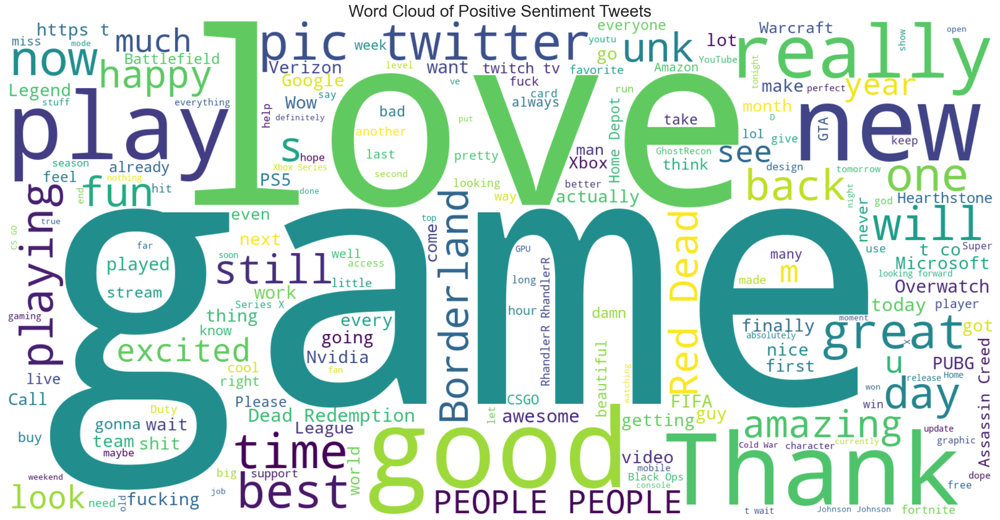

In [21]:
from wordcloud import WordCloud
# Filter positive sentiment tweets and extract the 'Tweet Content' column
positive_tweets = train[train["Sentiment"] == "Positive"]["Tweet Content"]
positive_text = ' '.join(positive_tweets)
wordcloud = WordCloud(width=1600, height=800, max_words=200, background_color='white').generate(positive_text)
plt.figure(figsize=(20, 12))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.title('Word Cloud of Positive Sentiment Tweets', fontsize=24)
plt.tight_layout(pad=0)
plt.show()


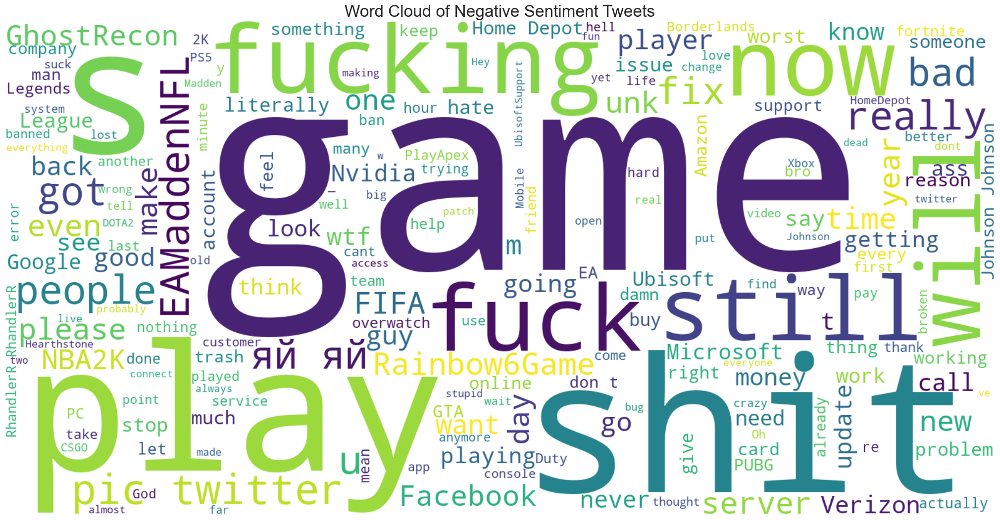

In [23]:
from wordcloud import WordCloud
# Filter positive sentiment tweets and extract the 'Tweet Content' column
negative_tweets = train[train["Sentiment"] == "Negative"]["Tweet Content"]
negative_text = ' '.join(negative_tweets)
wordcloud = WordCloud(width=1600, height=800, max_words=200, background_color='white').generate(negative_text)
plt.figure(figsize=(20, 12))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.title('Word Cloud of Negative Sentiment Tweets', fontsize=24)
plt.tight_layout(pad=0)
plt.show()


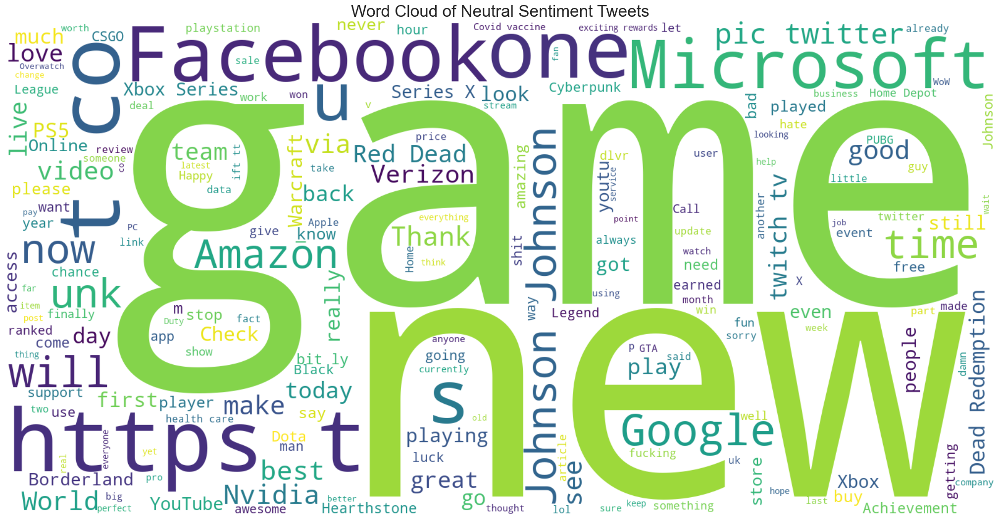

In [27]:
from wordcloud import WordCloud
neutral_tweets = train[train["Sentiment"] == "Neutral"]["Tweet Content"]
neutral_text = ' '.join(neutral_tweets)
wordcloud = WordCloud(width=1600, height=800, max_words=200, background_color='white').generate(neutral_text)
plt.figure(figsize=(20, 12))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.title('Word Cloud of Neutral Sentiment Tweets', fontsize=24)
plt.tight_layout(pad=0)
plt.show()


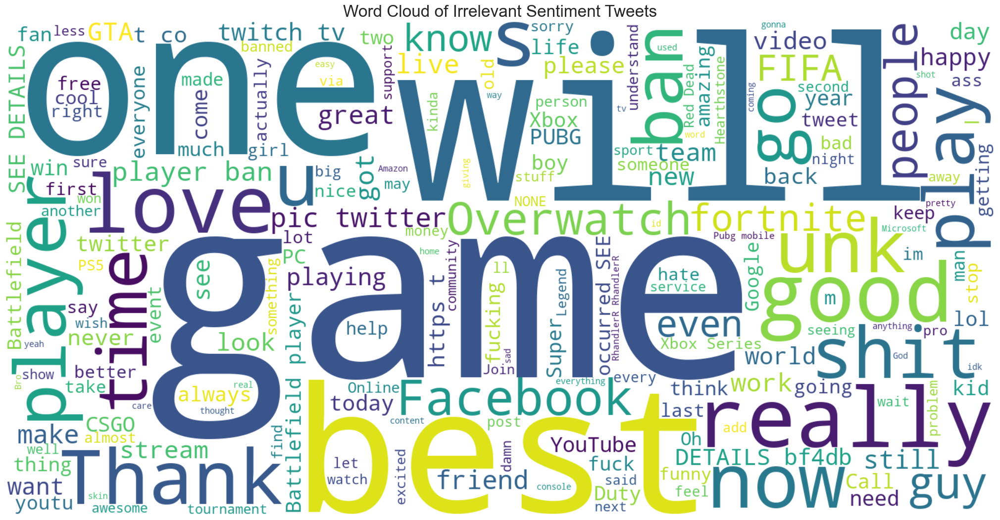

In [31]:
from wordcloud import WordCloud
Irrelevant_tweets = train[train["Sentiment"] == "Irrelevant"]["Tweet Content"]
Irrelevant_text = ' '.join(Irrelevant_tweets)
wordcloud = WordCloud(width=1600, height=800, max_words=200, background_color='white').generate(Irrelevant_text)
plt.figure(figsize=(20, 12))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.title('Word Cloud of Irrelevant Sentiment Tweets', fontsize=24)
plt.tight_layout(pad=0)
plt.show()


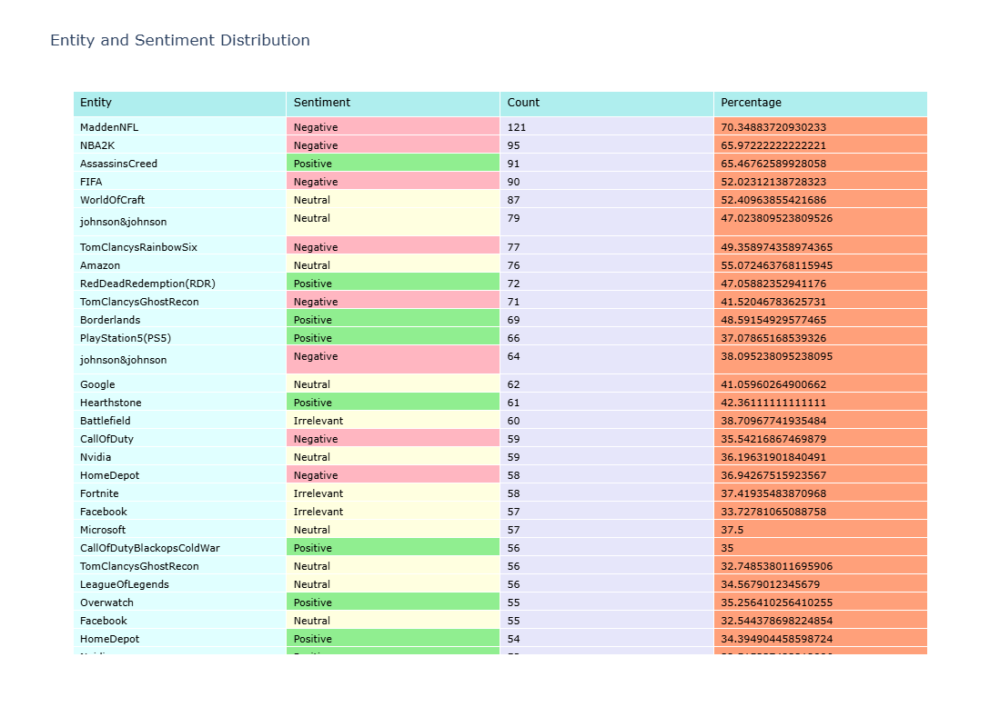

In [35]:
import plotly.graph_objects as go
grouped_counts = train.groupby(['Entity', 'Sentiment']).size().reset_index(name='Count')
entity_total_counts = grouped_counts.groupby('Entity')['Count'].transform('sum')
grouped_counts['Percentage'] = (grouped_counts['Count'] / entity_total_counts) * 100
grouped_counts = grouped_counts.sort_values('Count', ascending=False)
# Create a colorful table using Plotly
fig = go.Figure(data=[go.Table(
 header=dict(
 values=list(grouped_counts.columns),
 fill_color='paleturquoise',
 align='left',
 font=dict(color='black', size=12)
 ),
 cells=dict(
 values=[grouped_counts[k].tolist() for k in grouped_counts.columns],
 fill_color=[
 'lightcyan',
 ['lightgreen' if s == 'Positive' else 'lightpink' if s == 'Negative' else 'lightyellow' for s in grouped_counts['Sentiment']],
 'lavender',
 'lightsalmon'
 ],
 align='left',
 font=dict(color='black', size=11)
 ))
])
# Update the layout
fig.update_layout(
 title='Entity and Sentiment Distribution',
 width=800,
 height=800,
)
fig.show()


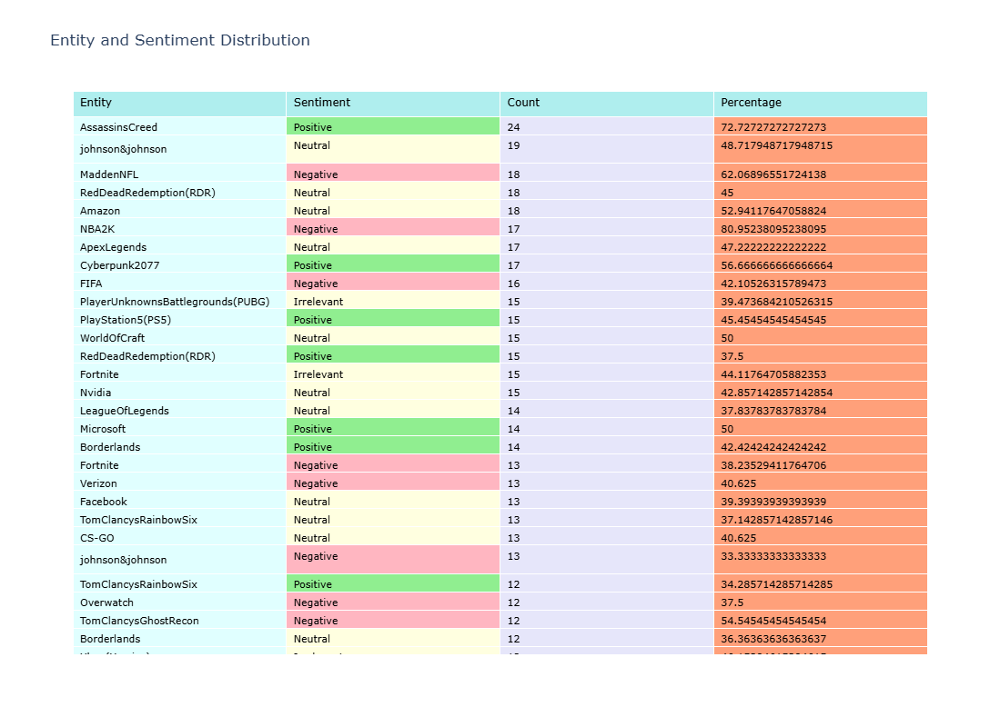

In [37]:
import plotly.graph_objects as go
# Group by 'Entity' and 'Sentiment' and calculate the count
grouped_counts = validation.groupby(['Entity', 'Sentiment']).size().reset_index(name='Count')
entity_total_counts = grouped_counts.groupby('Entity')['Count'].transform('sum')
grouped_counts['Percentage'] = (grouped_counts['Count'] / entity_total_counts) * 100
grouped_counts = grouped_counts.sort_values('Count', ascending=False)
# Create a colorful table using Plotly
fig = go.Figure(data=[go.Table(
 header=dict(
 values=list(grouped_counts.columns),
 fill_color='paleturquoise',
 align='left',
 font=dict(color='black', size=12)
 ),
 cells=dict(
 values=[grouped_counts[k].tolist() for k in grouped_counts.columns],
 fill_color=[
 'lightcyan',
 ['lightgreen' if s == 'Positive' else 'lightpink' if s == 'Negative' else 'lightyellow' for s in grouped_counts['Sentiment']],
 'lavender',
 'lightsalmon'
 ],
 align='left',
 font=dict(color='black', size=11)
 ))
])
fig.update_layout(
 title='Entity and Sentiment Distribution',
 width=800,
 height=800,
)
fig.show()


In [39]:
#Traditional Machine Learning Methods:  Support Vector Machines (SVM)  Naive Bayes classifiers Logistic Regression
# Decision Trees  Random Forests  Gradient Boosting Machines (XGBoost)  Gradient Boosting Machines (LightGBM)

In [41]:
from tensorflow.keras.layers import Input, Dropout, Dense
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.initializers import TruncatedNormal
from tensorflow.keras.losses import CategoricalCrossentropy
from tensorflow.keras.metrics import CategoricalAccuracy
from tensorflow.keras.utils import to_categorical
import pandas as pd
from sklearn.model_selection import train_test_split

In [43]:
import pandas as pd
import plotly.graph_objects as go


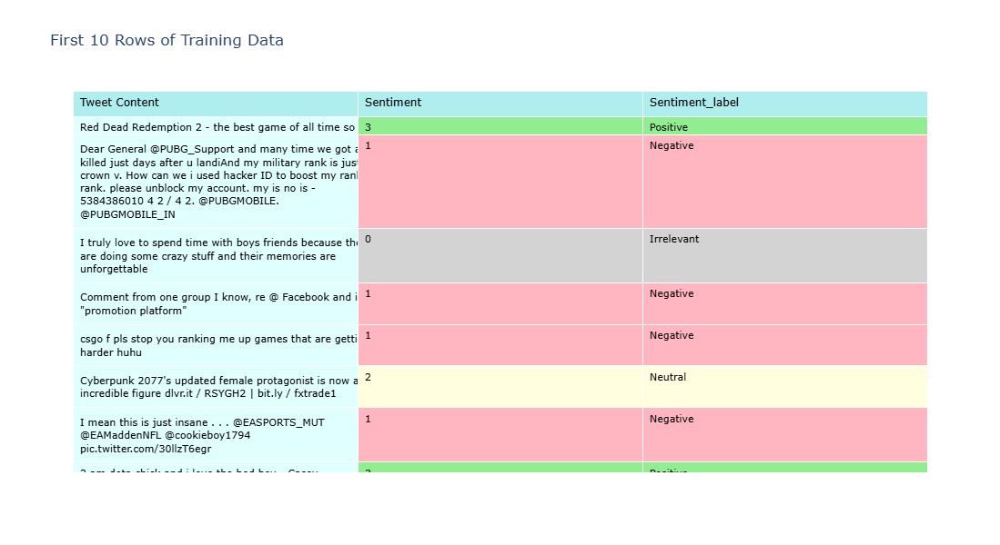

In [45]:
# Assuming you've already run the data preprocessing steps
data = train[['Tweet Content', 'Sentiment']]
# Set your model output as categorical and save in new label col
data['Sentiment_label'] = pd.Categorical(data['Sentiment'])
# Transform your output to numeric
data['Sentiment'] = data['Sentiment_label'].cat.codes
# Use the entire training data as data_train
data_train = data
# Use validation data as data_test
data_test = validation[['Tweet Content', 'Sentiment']]
data_test['Sentiment_label'] = pd.Categorical(data_test['Sentiment'])
data_test['Sentiment'] = data_test['Sentiment_label'].cat.codes
# Create a colorful table using Plotly
fig = go.Figure(data=[go.Table(
 header=dict(
 values=list(data_train.columns),
 fill_color='paleturquoise',
 align='left',
 font=dict(color='black', size=12)
 ),
 cells=dict(
 values=[data_train[k].tolist()[:10] for k in data_train.columns],
 fill_color=[
 'lightcyan', # Tweet Content
 ['lightgreen' if s == 'Positive' else 'lightpink' if s == 'Negative'
 else 'lightyellow' if s == 'Neutral' else 'lightgray' for s in data_train['Sentiment_label'][:10]], # Sentiment
 ['lightgreen' if s == 'Positive' else 'lightpink' if s == 'Negative'
 else 'lightyellow' if s == 'Neutral' else 'lightgray' for s in data_train['Sentiment_label'][:10]], # Sentiment_label
 'lavender' # Sentiment (numeric)
 ],
 align='left',
 font=dict(color='black', size=11)
 ))
])
# Update the layout
fig.update_layout(
 title='First 10 Rows of Training Data',
 width=1000,
 height=600,
)
fig.show()


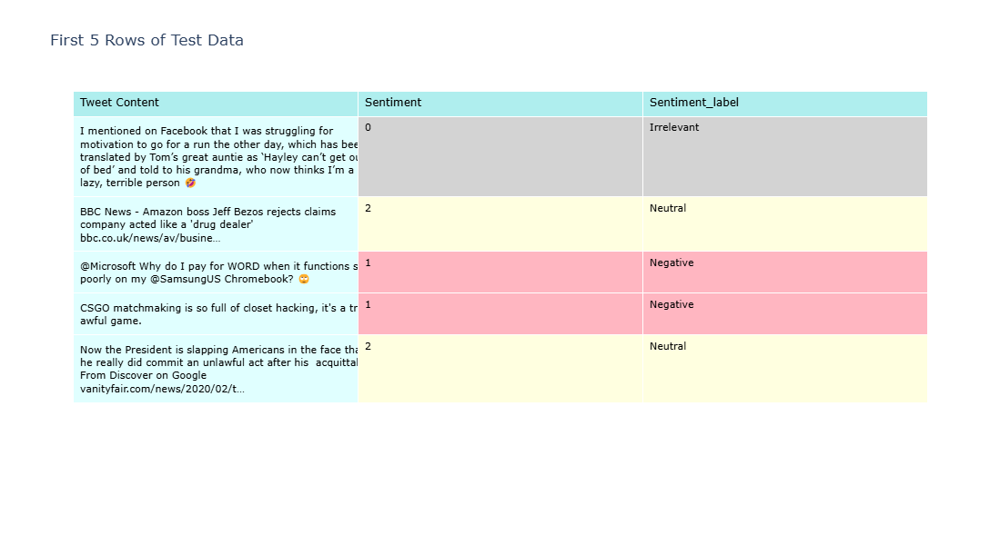

In [49]:
import plotly.graph_objects as go
# Create a colorful table using Plotly for the test data
fig = go.Figure(data=[go.Table(
 header=dict(
 values=list(data_test.columns),
 fill_color='paleturquoise',
 align='left',
 font=dict(color='black', size=12)
 ),
 cells=dict(
values=[data_test[k].tolist()[:5] for k in data_test.columns], # Show first 5 rows
 fill_color=[
 'lightcyan', # Tweet Content
 ['lightgreen' if s == 'Positive' else 'lightpink' if s == 'Negative'
 else 'lightyellow' if s == 'Neutral' else 'lightgray' for s in data_test['Sentiment_label'][:5]], # Sentiment
 ['lightgreen' if s == 'Positive' else 'lightpink' if s == 'Negative'
 else 'lightyellow' if s == 'Neutral' else 'lightgray' for s in data_test['Sentiment_label'][:5]], # Sentiment_label
 'lavender' # Sentiment (numeric)
 ],
 align='left',
 font=dict(color='black', size=11)
 ))
])
# Update the layout
fig.update_layout(
 title='First 5 Rows of Test Data',
 width=1000,
 height=600,
)
# Show the figure
fig.show()


In [51]:
%%time
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.svm import SVC
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score
# Extract text and labels
train_texts = data_train["Tweet Content"].tolist()
train_labels = data_train["Sentiment_label"].map({"Positive": 2, "Negative": 0, "Neutral": 1, "Irrelevant": 3})
test_texts = data_test["Tweet Content"].tolist()
test_labels = data_test["Sentiment_label"].map({"Positive": 2, "Negative": 0, "Neutral": 1, "Irrelevant": 3})
# Feature extraction using TF-IDF
vectorizer = TfidfVectorizer(max_features=5000) # Adjust max_features as needed
train_features = vectorizer.fit_transform(train_texts)
test_features = vectorizer.transform(test_texts)
# Train the SVM model
Svm = SVC(kernel="linear")
Svm.fit(train_features, train_labels)
# Make predictions on the validation/test set
predictions = Svm.predict(test_features)
# Calculate accuracy
accuracy = accuracy_score(test_labels, predictions)
# Print accuracy
print("Test Accuracy SVM:", accuracy)
print("\n")


Test Accuracy SVM: 0.649


CPU times: total: 2.52 s
Wall time: 3.01 s


In [55]:
print("Classification Report SVM:\n")
SVM = classification_report(test_labels, predictions, target_names=["Negative", "Neutral", "Positive", "Irrelevant"])
print(SVM)

Classification Report SVM:

              precision    recall  f1-score   support

    Negative       0.61      0.81      0.69       266
     Neutral       0.69      0.57      0.62       285
    Positive       0.66      0.71      0.69       277
  Irrelevant       0.66      0.43      0.52       172

    accuracy                           0.65      1000
   macro avg       0.66      0.63      0.63      1000
weighted avg       0.66      0.65      0.64      1000



In [57]:
# Print confusion matrix
confusion_matrix_svm = confusion_matrix(test_labels, predictions)
print("Confusion Matrix:\n", confusion_matrix_svm)


Confusion Matrix:
 [[216  21  24   5]
 [ 63 162  41  19]
 [ 38  28 197  14]
 [ 40  23  35  74]]


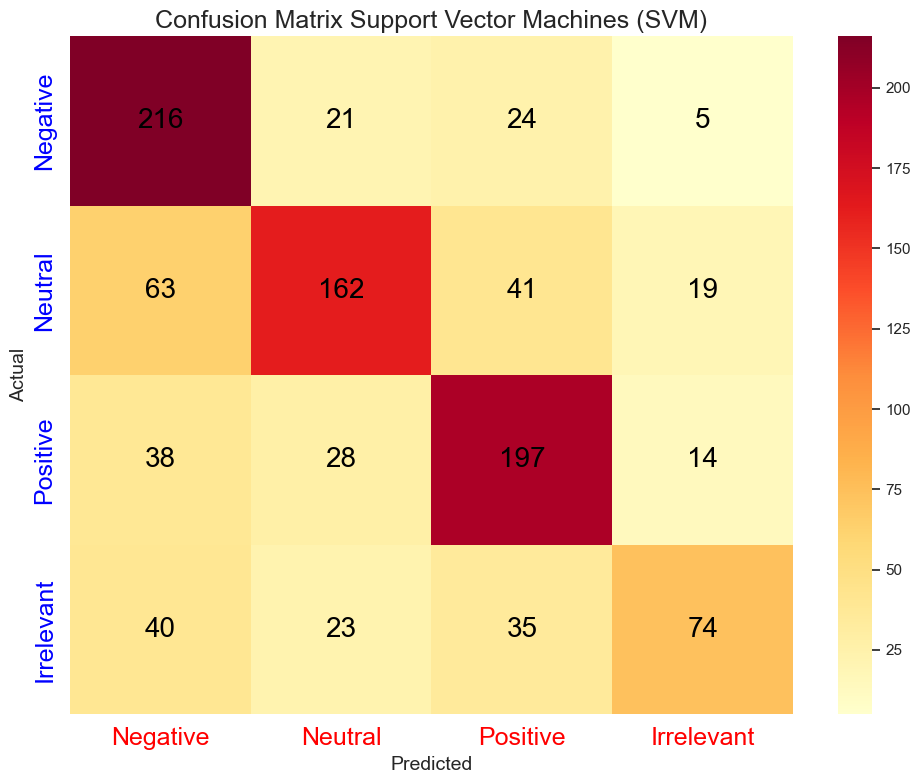

In [61]:
plt.figure(figsize=(10, 8)) # Increased figure size for better visibility
sns.heatmap(confusion_matrix_svm, annot=True, fmt='d', cmap='YlOrRd',annot_kws={"size": 20, "color": "Black"}) # Increased annotation size
plt.title('Confusion Matrix Support Vector Machines (SVM)', fontsize=18) # Increased title size
plt.ylabel('Actual', fontsize=14)
plt.xlabel('Predicted', fontsize=14)
plt.xticks([0.5, 1.5, 2.5, 3.5], ['Negative', 'Neutral', 'Positive', 'Irrelevant'], fontsize=18,color= 'Red')
plt.yticks([0.5, 1.5, 2.5, 3.5], ['Negative', 'Neutral', 'Positive', 'Irrelevant'], fontsize=18, color= 'Blue')
plt.tight_layout()
plt.show()



In [63]:
%%time
import pandas as pd
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.naive_bayes import MultinomialNB
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score


CPU times: total: 0 ns
Wall time: 4.01 ms


In [65]:
# Extract text and labels
train_texts = data_train["Tweet Content"].tolist()
train_labels = data_train["Sentiment_label"].map({"Positive": 2, "Negative": 0, "Neutral": 1, "Irrelevant": 3})
test_texts = data_test["Tweet Content"].tolist()
test_labels = data_test["Sentiment_label"].map({"Positive": 2, "Negative": 0, "Neutral": 1, "Irrelevant": 3})
# Feature extraction using TF-IDF
vectorizer = TfidfVectorizer(max_features=5000) # Adjust max_features as needed
train_features = vectorizer.fit_transform(train_texts)
test_features = vectorizer.transform(test_texts)
# Train the Naive Bayes model
NB = MultinomialNB()
NB.fit(train_features, train_labels)
# Make predictions on the validation/test set
predictions = NB.predict(test_features)
# Calculate accuracy
accuracy = accuracy_score(test_labels, predictions)
# Print accuracy
print("Test Accuracy Naive Bayes:", accuracy)
print("\n")


Test Accuracy Naive Bayes: 0.586




In [67]:
confusion_matrix_NB = confusion_matrix(test_labels, predictions)
print("Confusion Matrix:\n", confusion_matrix_NB)

Confusion Matrix:
 [[223  15  28   0]
 [ 83 125  76   1]
 [ 45  18 214   0]
 [ 61  14  73  24]]


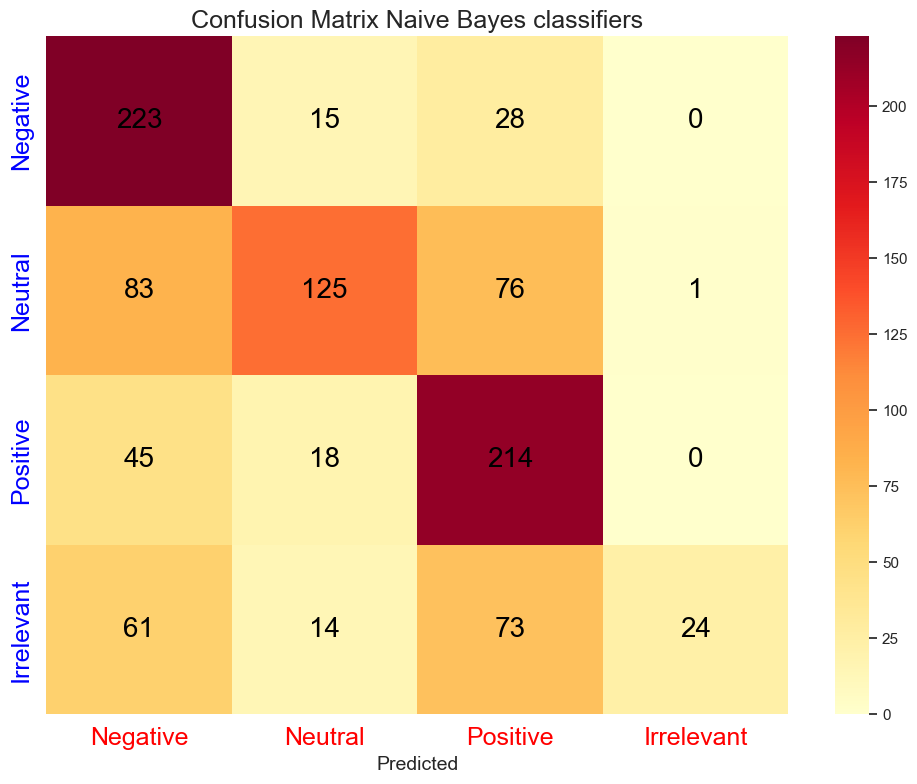

In [69]:
plt.figure(figsize=(10, 8)) # Increased figure size for better visibility
sns.heatmap(confusion_matrix_NB, annot=True, fmt='d', cmap='YlOrRd',annot_kws={"size": 20, "color": "Black"}) # Increased annotation size
plt.title('Confusion Matrix Naive Bayes classifiers', fontsize=18) # Increased title size plt.ylabel('Actual', fontsize=14)
plt.xlabel('Predicted', fontsize=14)
plt.xticks([0.5, 1.5, 2.5, 3.5], ['Negative', 'Neutral', 'Positive', 'Irrelevant'], fontsize=18,color = 'Red')
plt.yticks([0.5, 1.5, 2.5, 3.5], ['Negative', 'Neutral', 'Positive', 'Irrelevant'], fontsize=18, color= 'Blue')
plt.tight_layout()
plt.show()

In [71]:
%%time
import pandas as pd
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score
# Extract text and labels
train_texts = data_train["Tweet Content"].tolist()
train_labels = data_train["Sentiment_label"].map({"Positive": 2, "Negative": 0, "Neutral": 1, "Irrelevant": 3})
test_texts = data_test["Tweet Content"].tolist()
test_labels = data_test["Sentiment_label"].map({"Positive": 2, "Negative": 0, "Neutral": 1, "Irrelevant": 3})
# Feature extraction using TF-IDF
vectorizer = TfidfVectorizer(max_features=5000) # Adjust max_features as needed
train_features = vectorizer.fit_transform(train_texts)
test_features = vectorizer.transform(test_texts)
# Train the Logistic Regression model
Lr = LogisticRegression(multi_class='multinomial', solver='lbfgs') # Multiclass with L-BFGS solver
# Fit the model
Lr.fit(train_features, train_labels)


CPU times: total: 922 ms
Wall time: 423 ms


LogisticRegression(multi_class='multinomial')

In [73]:
# Make predictions on the validation/test set
predictions = Lr.predict(test_features)
# Calculate accuracy
accuracy = accuracy_score(test_labels, predictions)
# Print accuracy
print("Test Accuracy Logistic Regression:", accuracy)
print("\n")


Test Accuracy Logistic Regression: 0.64




In [77]:
print("Classification Report Logistic Regression:\n")
LR = classification_report(test_labels, predictions, target_names=["Negative", "Neutral", "Positive", "Irrelevant"])
print(LR)


Classification Report Logistic Regression:

              precision    recall  f1-score   support

    Negative       0.58      0.79      0.67       266
     Neutral       0.66      0.60      0.63       285
    Positive       0.66      0.71      0.68       277
  Irrelevant       0.74      0.37      0.50       172

    accuracy                           0.64      1000
   macro avg       0.66      0.62      0.62      1000
weighted avg       0.65      0.64      0.63      1000



In [79]:
# Print confusion matrix
confusion_matrix_lr = confusion_matrix(test_labels, predictions)
print("Confusion Matrix:\n\n", confusion_matrix_lr)


Confusion Matrix:

 [[210  26  26   4]
 [ 67 170  37  11]
 [ 41  33 196   7]
 [ 42  27  39  64]]


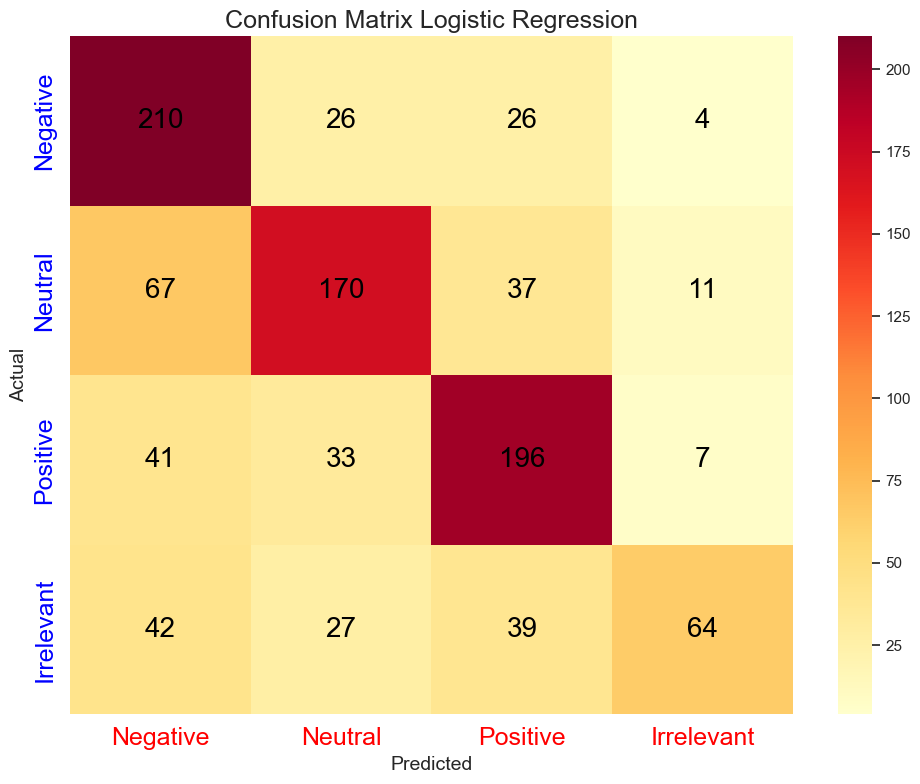

In [81]:
plt.figure(figsize=(10, 8)) # Increased figure size for better visibility
sns.heatmap(confusion_matrix_lr, annot=True, fmt='d', cmap='YlOrRd',annot_kws={"size": 20, "color": "Black"}) # Increased annotation size
plt.title('Confusion Matrix Logistic Regression', fontsize=18) # Increased title size
plt.ylabel('Actual', fontsize=14)
plt.xlabel('Predicted', fontsize=14)
plt.xticks([0.5, 1.5, 2.5, 3.5], ['Negative', 'Neutral', 'Positive', 'Irrelevant'], fontsize=18,color = 'Red')
plt.yticks([0.5, 1.5, 2.5, 3.5], ['Negative', 'Neutral', 'Positive', 'Irrelevant'], fontsize=18, color= 'Blue')
plt.tight_layout()
plt.show()


In [83]:
%%time
import pandas as pd
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score
# Extract text and labels
train_texts = data_train["Tweet Content"].tolist()
train_labels = data_train["Sentiment_label"].map({"Positive": 2, "Negative": 0, "Neutral": 1, "Irrelevant": 3})
test_texts = data_test["Tweet Content"].tolist()
test_labels = data_test["Sentiment_label"].map({"Positive": 2, "Negative": 0, "Neutral": 1, "Irrelevant": 3})
# Feature extraction using TF-IDF
vectorizer = TfidfVectorizer(max_features=5000) # Adjust max_features as needed
train_features = vectorizer.fit_transform(train_texts)
test_features = vectorizer.transform(test_texts)
# Train the Decision Tree Classifier model
Dt = DecisionTreeClassifier(random_state=42) # Set random state for reproducibility
# Fit the model
Dt.fit(train_features, train_labels)


CPU times: total: 562 ms
Wall time: 1.33 s


DecisionTreeClassifier(random_state=42)

In [85]:
predictions = Dt.predict(test_features)
accuracy = accuracy_score(test_labels, predictions)
print("Test Accuracy Decision Tree:", accuracy)
print("\n")

Test Accuracy Decision Tree: 0.554




In [89]:
print("Classification Report Decision Trees:\n")
Dt = classification_report(test_labels, predictions, target_names=["Negative", "Neutral", "Positive", "Irrelevant"])
print(Dt)


Classification Report Decision Trees:

              precision    recall  f1-score   support

    Negative       0.56      0.64      0.59       266
     Neutral       0.60      0.59      0.60       285
    Positive       0.53      0.56      0.54       277
  Irrelevant       0.49      0.37      0.42       172

    accuracy                           0.55      1000
   macro avg       0.55      0.54      0.54      1000
weighted avg       0.55      0.55      0.55      1000



In [91]:
# Print confusion matrix
confusion_matrix_dt = confusion_matrix(test_labels, predictions)
print("Confusion Matrix:\n\n", confusion_matrix_dt)


Confusion Matrix:

 [[169  36  47  14]
 [ 54 168  43  20]
 [ 51  40 154  32]
 [ 29  35  45  63]]


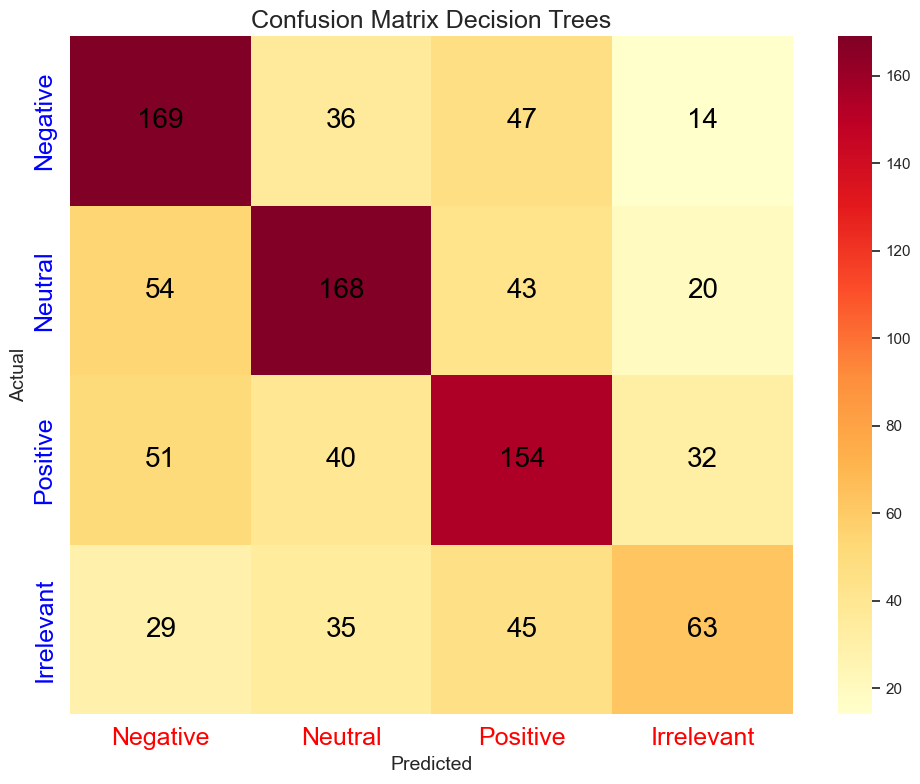

In [93]:
plt.figure(figsize=(10, 8)) # Increased figure size for better visibility
sns.heatmap(confusion_matrix_dt, annot=True, fmt='d', cmap='YlOrRd',annot_kws={"size":
20, "color": "Black"}) # Increased annotation size
plt.title('Confusion Matrix Decision Trees', fontsize=18) # Increased title size
plt.ylabel('Actual', fontsize=14)
plt.xlabel('Predicted', fontsize=14)
plt.xticks([0.5, 1.5, 2.5, 3.5], ['Negative', 'Neutral', 'Positive', 'Irrelevant'], fontsize=18,color
= 'Red')
plt.yticks([0.5, 1.5, 2.5, 3.5], ['Negative', 'Neutral', 'Positive', 'Irrelevant'], fontsize=18, color
= 'Blue')
plt.tight_layout()
plt.show()

In [95]:
%%time
import pandas as pd
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score
# Extract text and labels
train_texts = data_train["Tweet Content"].tolist()
train_labels = data_train["Sentiment_label"].map({"Positive": 2, "Negative": 0, "Neutral": 1, "Irrelevant": 3})
test_texts = data_test["Tweet Content"].tolist()
test_labels = data_test["Sentiment_label"].map({"Positive": 2, "Negative": 0, "Neutral": 1, "Irrelevant": 3})
# Feature extraction using TF-IDF
vectorizer = TfidfVectorizer(max_features=5000) # Adjust max_features as needed
train_features = vectorizer.fit_transform(train_texts)
test_features = vectorizer.transform(test_texts)
# Train the Random Forest Classifier model
Rf = RandomForestClassifier(n_estimators=100, random_state=42) # Adjust n_estimators as needed
Rf.fit(train_features, train_labels)
predictions = Rf.predict(test_features)
accuracy = accuracy_score(test_labels, predictions)
print("Test Accuracy Random Forest:", accuracy)
print("\n")


Test Accuracy Random Forest: 0.667


CPU times: total: 3.38 s
Wall time: 4.11 s


In [99]:
print("Classification Report Random Forests:\n")
Rf = classification_report(test_labels, predictions, target_names=["Negative", "Neutral", "Positive", "Irrelevant"])
print(Rf)

Classification Report Random Forests:

              precision    recall  f1-score   support

    Negative       0.63      0.79      0.70       266
     Neutral       0.68      0.71      0.70       285
    Positive       0.65      0.71      0.68       277
  Irrelevant       0.90      0.32      0.47       172

    accuracy                           0.67      1000
   macro avg       0.71      0.64      0.64      1000
weighted avg       0.70      0.67      0.65      1000



In [101]:
# Print confusion matrix
confusion_matrix_rf = confusion_matrix(test_labels, predictions)
print("Confusion Matrix:\n\n", confusion_matrix_rf)

Confusion Matrix:

 [[211  25  28   2]
 [ 43 203  38   1]
 [ 41  35 198   3]
 [ 40  36  41  55]]


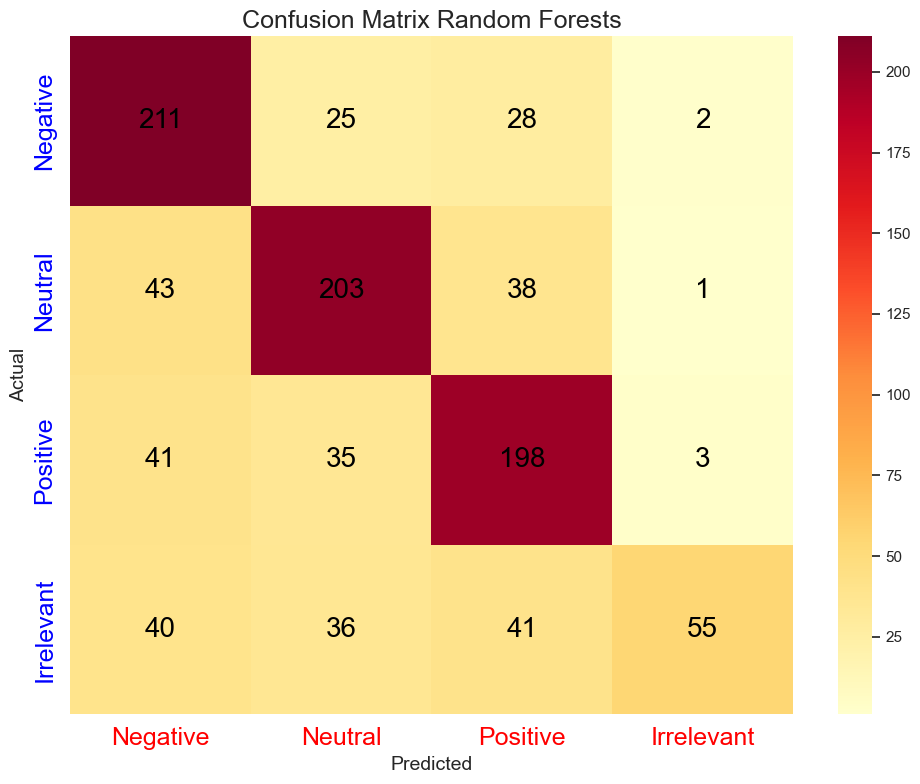

In [103]:
plt.figure(figsize=(10, 8)) # Increased figure size for better visibility
sns.heatmap(confusion_matrix_rf, annot=True, fmt='d', cmap='YlOrRd',annot_kws={"size":
20, "color": "Black"}) # Increased annotation size
plt.title('Confusion Matrix Random Forests', fontsize=18) # Increased title size
plt.ylabel('Actual', fontsize=14)
plt.xlabel('Predicted', fontsize=14)
plt.xticks([0.5, 1.5, 2.5, 3.5], ['Negative', 'Neutral', 'Positive', 'Irrelevant'], fontsize=18,color
= 'Red')
plt.yticks([0.5, 1.5, 2.5, 3.5], ['Negative', 'Neutral', 'Positive', 'Irrelevant'], fontsize=18, color
= 'Blue')
plt.tight_layout()
plt.show()



In [107]:
%%time
import pandas as pd
from sklearn.feature_extraction.text import TfidfVectorizer
import xgboost as xgb
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score
# Extract text and labels
train_texts = data_train["Tweet Content"].tolist()
train_labels = data_train["Sentiment_label"].map({"Positive": 2, "Negative": 0, "Neutral": 1, "Irrelevant": 3})
test_texts = data_test["Tweet Content"].tolist()
test_labels = data_test["Sentiment_label"].map({"Positive": 2, "Negative": 0, "Neutral": 1, "Irrelevant": 3})
# Feature extraction using TF-IDF
vectorizer = TfidfVectorizer(max_features=5000) # Adjust max_features as needed
train_features = vectorizer.fit_transform(train_texts)
test_features = vectorizer.transform(test_texts)
# Convert to DMatrix format for XGBoost
dtrain = xgb.DMatrix(train_features, label=train_labels)
dtest = xgb.DMatrix(test_features, label=test_labels)
# Set XGBoost parameter
params = {
 'objective': 'multi:softmax', # For multi-class classification
 'num_class': 4, # Number of classes
 'eta': 0.3, # Learning rate
 'max_depth': 6, # Maximum depth of trees
 'eval_metric': 'mlogloss' # Evaluation metric
}
# Train the XGBoost model
Xgb = xgb.train(params, dtrain, num_boost_round=10) # Adjust num_boost_round as needed
# Make predictions on the validation/test set
predictions = Xgb.predict(dtest)
# Calculate accuracy
accuracy = accuracy_score(test_labels, predictions)
# Print accuracy
print("Test Accuracy XGBoost:", accuracy)
print("\n")


Test Accuracy XGBoost: 0.526


CPU times: total: 5.86 s
Wall time: 400 ms


In [111]:
print("Classification Report XGBoost:\n")
Xgb = classification_report(test_labels, predictions, target_names=["Negative", "Neutral", "Positive", "Irrelevant"])
print(Xgb)


Classification Report XGBoost:

              precision    recall  f1-score   support

    Negative       0.44      0.82      0.57       266
     Neutral       0.62      0.49      0.55       285
    Positive       0.61      0.52      0.56       277
  Irrelevant       0.60      0.15      0.23       172

    accuracy                           0.53      1000
   macro avg       0.57      0.49      0.48      1000
weighted avg       0.56      0.53      0.50      1000



In [113]:
confusion_matrix_xgb = confusion_matrix(test_labels, predictions)
print("Confusion Matrix:\n\n", confusion_matrix_xgb)


Confusion Matrix:

 [[217  20  23   6]
 [108 139  32   6]
 [ 98  29 145   5]
 [ 72  36  39  25]]


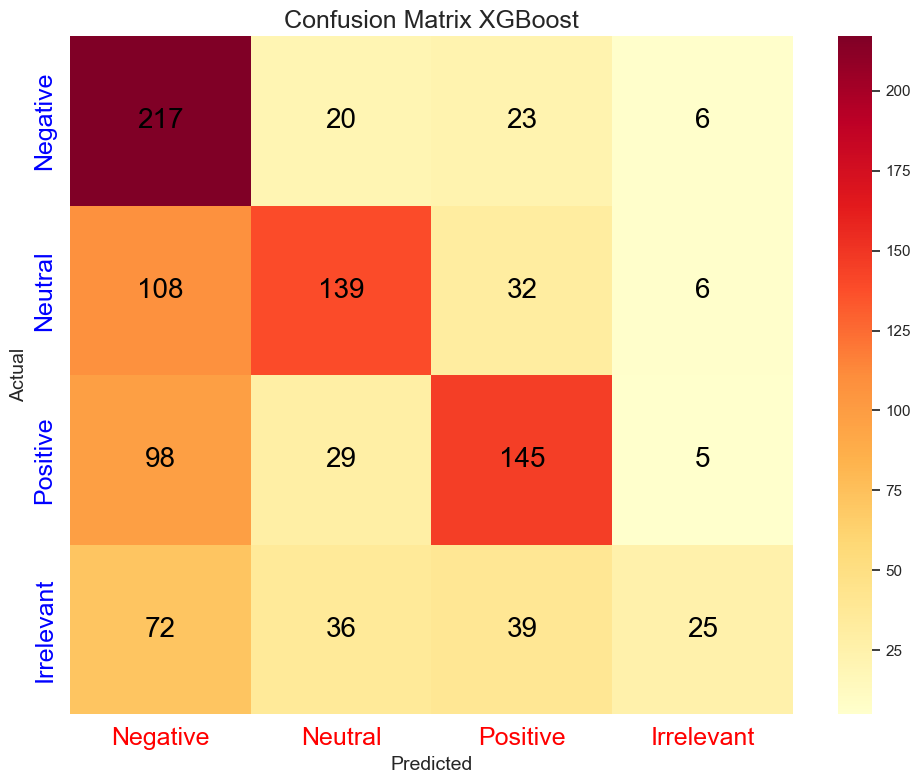

In [117]:
plt.figure(figsize=(10, 8)) # Increased figure size for better visibility
sns.heatmap(confusion_matrix_xgb, annot=True, fmt='d', cmap='YlOrRd',annot_kws={"size": 20, "color": "Black"}) # Increased annotation size
plt.title('Confusion Matrix XGBoost', fontsize=18) # Increased title size
plt.ylabel('Actual', fontsize=14)
plt.xlabel('Predicted', fontsize=14)
plt.xticks([0.5, 1.5, 2.5, 3.5], ['Negative', 'Neutral', 'Positive', 'Irrelevant'], fontsize=18,color = 'Red')
plt.yticks([0.5, 1.5, 2.5, 3.5], ['Negative', 'Neutral', 'Positive', 'Irrelevant'], fontsize=18, color= 'Blue')
plt.tight_layout()
plt.show()


In [123]:
%%time
import pandas as pd
from sklearn.feature_extraction.text import TfidfVectorizer
import lightgbm as lgb
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score
from sklearn.preprocessing import LabelEncoder
# Extract text and labels
train_texts = data_train["Tweet Content"].tolist()
test_texts = data_test["Tweet Content"].tolist()
# Use LabelEncoder to convert categorical labels to numerical
le = LabelEncoder()
train_labels = le.fit_transform(data_train["Sentiment_label"])
test_labels = le.transform(data_test["Sentiment_label"])
# Feature extraction using TF-IDF
vectorizer = TfidfVectorizer(max_features=5000) # Adjust max_features as needed
train_features = vectorizer.fit_transform(train_texts)
test_features = vectorizer.transform(test_texts)
# Create LightGBM datasets
train_data = lgb.Dataset(train_features, label=train_labels)
test_data = lgb.Dataset(test_features, label=test_labels)
# Set LightGBM parameters
params = {
 'objective': 'multiclass',
 'num_class': len(le.classes_),
 'metric': 'multi_logloss',
 'learning_rate': 0.1,
 'max_depth': -1,
 'num_leaves': 31
}
# Train the LightGBM model
Lgbm = lgb.train(
 params,
 train_data,
 valid_sets=[test_data],
 num_boost_round=100,
 callbacks=[lgb.log_evaluation(period=100)]
)
# Make predictions on the validation/test set
predictions = Lgbm.predict(test_features)
predictions = predictions.argmax(axis=1) # Convert probabilities to class labels
# Calculate accuracy
accuracy = accuracy_score(test_labels, predictions)
print("\n")
print("\033[91mTest Accuracy LightGBM:\033[0m", accuracy)
print("\n")

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.010110 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 17528
[LightGBM] [Info] Number of data points in the train set: 4940, number of used features: 579
[LightGBM] [Info] Start training from score -1.784900
[LightGBM] [Info] Start training from score -1.188572
[LightGBM] [Info] Start training from score -1.399334
[LightGBM] [Info] Start training from score -1.270222
[100]	valid_0's multi_logloss: 0.948651


Test Accuracy LightGBM: 0.621


CPU times: total: 13.3 s
Wall time: 792 ms


In [125]:
print("Classification Report LightGBM:\n")
Lgbm = classification_report(test_labels, predictions, target_names=["Negative", "Neutral",
"Positive", "Irrelevant"])
print(Lgbm)


Classification Report LightGBM:

              precision    recall  f1-score   support

    Negative       0.59      0.41      0.48       172
     Neutral       0.61      0.73      0.66       266
    Positive       0.65      0.60      0.62       285
  Irrelevant       0.62      0.67      0.65       277

    accuracy                           0.62      1000
   macro avg       0.62      0.60      0.60      1000
weighted avg       0.62      0.62      0.62      1000



In [127]:
confusion_matrix_lgbm = confusion_matrix(test_labels, predictions)
print("Confusion Matrix:\n\n", confusion_matrix_lgbm)

Confusion Matrix:

 [[ 70  37  31  34]
 [  8 194  29  35]
 [ 19  52 172  42]
 [ 21  37  34 185]]


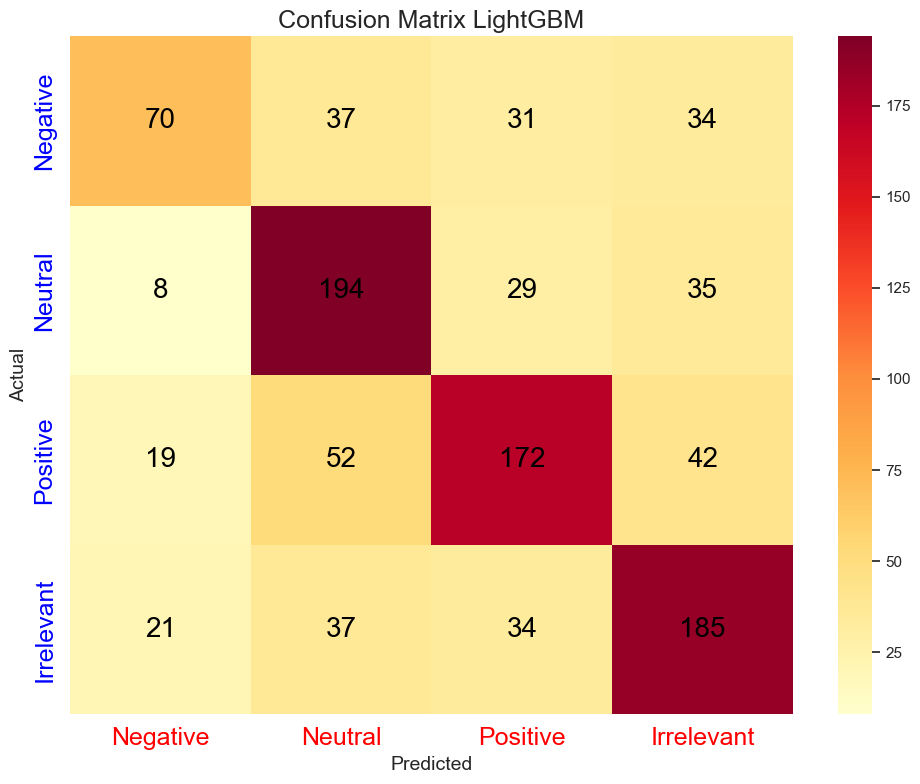

In [131]:
plt.figure(figsize=(10, 8)) # Increased figure size for better visibility
sns.heatmap(confusion_matrix_lgbm, annot=True, fmt='d', cmap='YlOrRd',annot_kws={"size": 20, "color": "Black"}) # Increased annotation size
plt.title('Confusion Matrix LightGBM', fontsize=18) # Increased title size
plt.ylabel('Actual', fontsize=14)
plt.xlabel('Predicted', fontsize=14)
plt.xticks([0.5, 1.5, 2.5, 3.5], ['Negative', 'Neutral', 'Positive', 'Irrelevant'], fontsize=18,color
= 'Red')
plt.yticks([0.5, 1.5, 2.5, 3.5], ['Negative', 'Neutral', 'Positive', 'Irrelevant'], fontsize=18, color
= 'Blue')
plt.tight_layout()


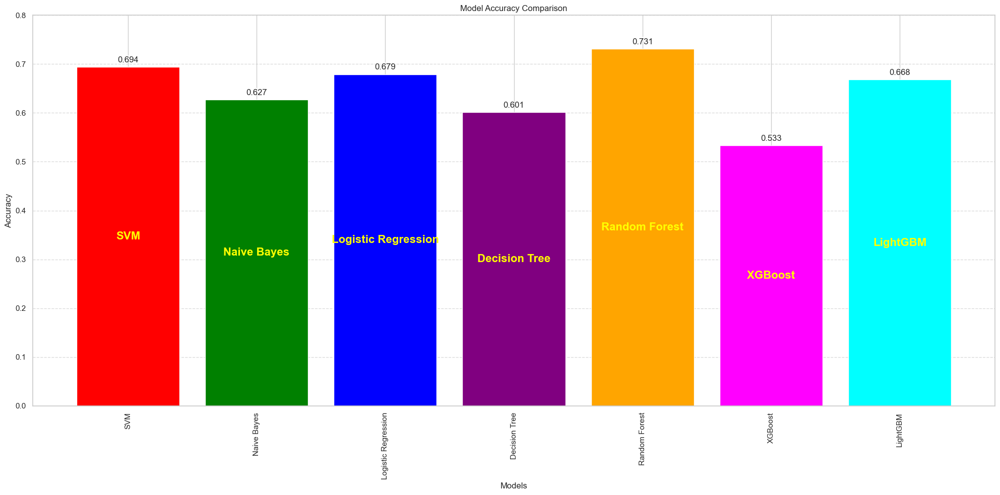

In [141]:
import matplotlib.pyplot as plt
from pylab import rcParams
rcParams['figure.figsize'] = 20, 10
# Model names and their corresponding accuracies
models = ['SVM', 'Naive Bayes', 'Logistic Regression', 'Decision Tree', 'Random Forest', 'XGBoost', 'LightGBM']
accuracies = [0.694, 0.627, 0.679, 0.601, 0.731, 0.533, 0.668]
# Create a list of different colors for the bars
colors = ['red', 'green', 'blue', 'purple', 'orange', 'magenta', 'cyan']
# Create the bar graph
plt.bar(models, accuracies, color=colors)
# Add value labels on top of each bar with white color
for index, (value, model_name) in enumerate(zip(accuracies, models)):
 plt.text(index, value + 0.01, str(value), ha='center', va='bottom', color='white', fontsize=12,fontweight='bold')
 # Add model names within the bars with white color and adjust vertical alignment
 plt.text(index, value / 2, model_name, ha='center', va='center', color='Yellow', fontsize=16, fontweight='bold') # Shorten model names for better fit
 
# Add value labels on top of each bar
for index, value in enumerate(accuracies):
 plt.text(index, value + 0.01, str(value), ha='center')
plt.xlabel('Models')
plt.ylabel('Accuracy')
plt.title('Model Accuracy Comparison')
plt.ylim([0, .8])
plt.xticks(rotation=90)
plt.grid(axis='y', linestyle='--', alpha=0.7) # Add a faint grid for better readability
plt.tight_layout() # Adjust spacing to prevent overlapping elements
plt.show()

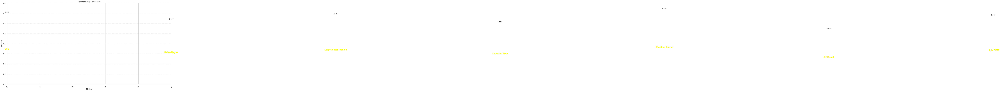